In [1]:
import torch.nn as nn
import torch
# from .modules import *
import torch.nn.functional as F
from torch.utils.data import Dataset
import os
from PIL import Image
import numpy as np

In [2]:
from torch.nn.modules.utils import _pair

In [3]:
from timm.layers import to_2tuple, trunc_normal_,DropPath


In [4]:
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

In [5]:
!pip install "https://shi-labs.com/natten/wheels/cu124/torch2.6.0/natten-0.17.5+torch260cu124-cp311-cp311-linux_x86_64.whl"

  Using cached https://shi-labs.com/natten/wheels/cu124/torch2.6.0/natten-0.17.5+torch260cu124-cp311-cp311-linux_x86_64.whl (474.7 MB)


In [6]:
from natten import NeighborhoodAttention2D

In [7]:
from torchvision.ops.misc import SqueezeExcitation

## Multi_branch_module

In [8]:
class Multi_Branch_Module(nn.Module):
    def __init__(self, input_channel, expand_channel, out_channel, large_kernel_size, kernel_size, stride=1, deploy=False):
        super(Multi_Branch_Module, self).__init__()
        self.input_channel = input_channel
        self.expand_channel = expand_channel
        self.out_channel = out_channel
        self.kernel_size = kernel_size
        self.stride = stride
        self.large_kernel_size = large_kernel_size

        se_input = expand_channel
        se_squeeze = se_input // 4
        self.se = SqueezeExcitation(input_channels=se_input,
                                    squeeze_channels=se_squeeze)

        self.expand_conv = nn.Sequential(
            nn.Conv2d(input_channel, expand_channel,
                      kernel_size=1, stride=1, bias=False), # Bias False before BN
            nn.BatchNorm2d(expand_channel),
            nn.Hardswish(inplace=True)
        )

        if deploy: 
            self.fused_conv = nn.Conv2d(in_channels=expand_channel, out_channels=expand_channel,
                                        kernel_size=large_kernel_size, stride=stride,
                                        padding=large_kernel_size // 2, groups=expand_channel, bias=True)
            self.deploy = True
        else: 
            self.large_conv = nn.Sequential(
                nn.Conv2d(in_channels=expand_channel, out_channels=expand_channel,
                          kernel_size=large_kernel_size, stride=stride,
                          padding=large_kernel_size // 2, groups=expand_channel, bias=False),
                nn.BatchNorm2d(expand_channel)
            )
            self.square_conv = nn.Sequential(
                nn.Conv2d(in_channels=expand_channel, out_channels=expand_channel,
                          kernel_size=kernel_size, stride=stride,
                          padding=kernel_size // 2, groups=expand_channel, bias=False),
                nn.BatchNorm2d(expand_channel)
            )
            self.ver_conv = nn.Sequential(
                nn.Conv2d(in_channels=expand_channel, out_channels=expand_channel,
                          kernel_size=(kernel_size, 1), stride=stride,
                          padding=(kernel_size // 2, 0), groups=expand_channel, bias=False),
                nn.BatchNorm2d(expand_channel)
            )
            self.hor_conv = nn.Sequential(
                nn.Conv2d(in_channels=expand_channel, out_channels=expand_channel,
                          kernel_size=(1, kernel_size), stride=stride,
                          padding=(0, kernel_size // 2), groups=expand_channel, bias=False),
                nn.BatchNorm2d(expand_channel)
            )
            self.deploy = False


        self.active = nn.ReLU() 

        self.pointwise_conv  = nn.Conv2d(expand_channel, out_channel, kernel_size=1, stride=1, padding=0, bias=True) 
        
        if stride > 1 or input_channel != out_channel:
            self.skip = nn.Sequential(
                nn.Conv2d(input_channel, out_channel, kernel_size=1, stride=stride, padding=0, bias=False),
                nn.BatchNorm2d(out_channel)
            )
        elif input_channel == out_channel and stride == 1:
            self.skip = nn.Identity()
        else: 
            self.skip = None


    def forward(self, x):
        identity = x 
        
        x_expanded = self.expand_conv(x)

        if self.deploy:
            out_branches = self.fused_conv(x_expanded)
        else:
            out_branches = self.large_conv(x_expanded)
            out_branches += self.square_conv(x_expanded)
            out_branches += self.ver_conv(x_expanded)
            out_branches += self.hor_conv(x_expanded)

        x_activated = self.active(out_branches)
        x_se = self.se(x_activated)
        x_pointwise = self.pointwise_conv(x_se)

        out_final = x_pointwise + self.skip(identity)
        return out_final

    def fuse_batchnorm(self, conv, bn):
        kernel = conv.weight
        running_mean = bn.running_mean
        running_var = bn.running_var
        gamma = bn.weight
        beta = bn.bias
        eps = bn.eps

        std = (running_var + eps).sqrt()
        t = (gamma / std).reshape(-1, 1, 1, 1)

        fused_kernel = kernel * t
        fused_bias = beta - (running_mean * gamma / std)
        return fused_kernel, fused_bias

    def axial_to_square_kernel(self, square_kernel_base, asym_kernel):
        square_kernel = square_kernel_base.clone()
        asym_h = asym_kernel.size(2)
        asym_w = asym_kernel.size(3)
        square_h = square_kernel.size(2)
        square_w = square_kernel.size(3)

        pad_h_start = (square_h - asym_h) // 2
        pad_w_start = (square_w - asym_w) // 2

        square_kernel[:, :, pad_h_start : pad_h_start + asym_h,
                            pad_w_start : pad_w_start + asym_w] += asym_kernel
        return square_kernel

    def get_equivalent_kernel_bias(self):


        large_k, large_b = self.fuse_batchnorm(self.large_conv[0], self.large_conv[1])
        square_k, square_b = self.fuse_batchnorm(self.square_conv[0], self.square_conv[1])
        hor_k, hor_b = self.fuse_batchnorm(self.hor_conv[0], self.hor_conv[1])
        ver_k, ver_b = self.fuse_batchnorm(self.ver_conv[0], self.ver_conv[1])

        fused_small_k = self.axial_to_square_kernel(square_k, hor_k)
        fused_small_k = self.axial_to_square_kernel(fused_small_k, ver_k) 

        total_branch_bias = large_b + square_b + hor_b + ver_b

        padding_val = (self.large_kernel_size - self.kernel_size) // 2
        if padding_val < 0:
            raise ValueError(f"Large kernel size ({self.large_kernel_size}) must be >= kernel size ({self.kernel_size}).")

        if padding_val > 0:
            padded_fused_small_k = F.pad(fused_small_k, [padding_val] * 4)
        else: #
            padded_fused_small_k = fused_small_k

        final_fused_kernel = large_k + padded_fused_small_k

        return final_fused_kernel, total_branch_bias

    def switch_to_deploy(self):
        if self.deploy:
            print("Module is already in deploy mode.")
            return 

        fused_kernel, fused_bias = self.get_equivalent_kernel_bias()

        self.fused_conv = nn.Conv2d(
            in_channels=self.expand_channel,    
            out_channels=self.expand_channel,   
            kernel_size=self.large_kernel_size,
            stride=self.stride,
            padding=self.large_kernel_size // 2,
            groups=self.expand_channel,         
            bias=True                           
        )

        self.fused_conv.weight.data = fused_kernel
        self.fused_conv.bias.data = fused_bias

        self.deploy = True

        self.__delattr__('large_conv')
        self.__delattr__('square_conv')
        self.__delattr__('ver_conv')
        self.__delattr__('hor_conv')

        print(f"Switched module to deploy mode. Fused convolution: {self.fused_conv}")

## Feature pyramid

In [9]:
class FeaturePyramidEmbed(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super().__init__()
        total_in_channels = sum(in_channels_list)
        
        self.conv_embed = nn.Conv2d(
            total_in_channels, 
            out_channels, 
            kernel_size=3, 
            stride=1, 
            padding=1, 
            bias=False
        )
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.GELU()  
        
    def forward(self, feature_pyramid_list):
        target_size = feature_pyramid_list[-1].shape[2:]  
        
        resized_features = [
            nn.functional.adaptive_avg_pool2d(feat, target_size)
            for feat in feature_pyramid_list[:-1] 
        ]
        resized_features.append(feature_pyramid_list[-1])
        
        concatenated_features = torch.cat(resized_features, dim=1)
        
        embedded_features = self.conv_embed(concatenated_features)
        # embedded_features = self.act(self.bn(embedded_features))
        
        return embedded_features


In [10]:
class EnhancedFeaturePyramid(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super().__init__()
        self.in_channels_list = in_channels_list
        self.out_channels = out_channels

        # Step 1: Lateral connections - reduce all feature channels to same dimension
        # This allows features from different scales to be combined
        self.lateral_convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(in_ch, out_channels, 1, bias=False),
                nn.BatchNorm2d(out_channels)
            ) for in_ch in in_channels_list
        ])

        # Step 2: Feature refinement after top-down fusion
        # These convolutions smooth the upsampled features and reduce aliasing
        self.fpn_convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.GELU()
            ) for _ in in_channels_list
        ])

        # Step 3: Attention-based feature importance weighting
        # This learns which scale features are most important for crack detection
        self.attention_fusion = nn.Sequential(
            nn.Conv2d(out_channels * len(in_channels_list), out_channels // 4, 1),
            nn.BatchNorm2d(out_channels // 4),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels // 4, len(in_channels_list), 1),
            nn.Sigmoid()  # Output attention weights for each scale
        )

        # Step 4: Final feature fusion
        self.final_conv = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.GELU()
        )

    def forward(self, feature_pyramid_list):
        """
        Enhanced Feature Pyramid Processing:

        Input: [x1_skip, x2_skip, x3_skip, x4_skip, bottleneck]
        Channels: [12, 24, 48, 96, 192] -> All converted to out_channels
        Sizes: [H, H/2, H/4, H/8, H/16] -> All processed at multiple scales

        Process:
        1. Lateral convs: Standardize all channels to out_channels
        2. Top-down fusion: High-level features enhance low-level ones
        3. Feature refinement: Smooth and enhance fused features
        4. Attention weighting: Learn importance of each scale
        5. Final fusion: Combine weighted features at target resolution
        """

        # Step 1: Apply lateral convolutions to standardize channels
        laterals = [conv(feat) for conv, feat in zip(self.lateral_convs, feature_pyramid_list)]

        # Step 2: Top-down pathway - high-level features enhance lower levels
        # Start from the deepest feature (bottleneck) and work upward
        for i in range(len(laterals) - 2, -1, -1):
            # Upsample the deeper feature to match current level size
            upsampled = F.interpolate(
                laterals[i + 1],
                size=laterals[i].shape[2:],
                mode='bilinear',
                align_corners=False
            )
            # Fuse: current level + upsampled deeper level
            laterals[i] = laterals[i] + upsampled

        # Step 3: Apply refinement convolutions to smooth fused features
        fpn_features = [conv(feat) for conv, feat in zip(self.fpn_convs, laterals)]

        # Step 4: Resize all features to target size (smallest feature map for efficiency)
        target_size = fpn_features[-1].shape[2:]  # Use bottleneck size
        resized_features = [
            F.interpolate(feat, size=target_size, mode='bilinear', align_corners=False)
            for feat in fpn_features
        ]

        # Step 5: Learn attention weights for each scale
        concat_for_attention = torch.cat(resized_features, dim=1)
        attention_weights = self.attention_fusion(concat_for_attention)  # Shape: [B, num_scales, H, W]

        # Step 6: Apply learned attention weights to each scale
        weighted_sum = torch.zeros_like(resized_features[0])
        for i, feat in enumerate(resized_features):
            weight = attention_weights[:, i:i+1, :, :]  # Extract weight for scale i
            weighted_sum = weighted_sum + feat * weight

        # Step 7: Final refinement
        output = self.final_conv(weighted_sum)

        return output


## GFT

In [11]:
class GlobalAttention(nn.Module):
    def __init__(self, dim, num_heads=8, qkv_bias=True, qk_scale=None, attn_drop=0., proj_drop=0.):
        super().__init__()
        assert dim % num_heads == 0, f"dim {dim} should be divided by num_heads {num_heads}."

        self.dim = dim
        self.num_heads = num_heads
        self.head_dim = dim // num_heads
        self.scale = qk_scale or self.head_dim ** -0.5
        #self.q = nn.Linear(dim,  2, bias=qkv_bias)
        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(proj_drop)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, -1, 3, self.num_heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q,k, v = qkv[0], qkv[1], qkv[2]

        attn = (q @ k.transpose(-2, -1)) * self.scale
        attn = attn.softmax(dim=-1)
        attn = self.attn_drop(attn)

        x = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x

In [12]:
class GFT(nn.Module):
    def __init__(self, patchsize, img_size, in_channels, expand_ratios, out_channel, stride, num_heads):
        super(GFT, self).__init__()
        # Patch embedding with overlap
        self.patchembedding = OverlapPatchEmbed(
            patchsize=patchsize, 
            in_channels=in_channels,
            embed_dim=in_channels,
            stride=stride
        )
        
        # Layer normalization and attention
        self.norm1 = nn.LayerNorm(in_channels)
        self.attention = GlobalAttention(
            dim=in_channels,
            num_heads=num_heads
        )
        
        # MLP block with layer norm
        self.norm2 = nn.LayerNorm(in_channels)
        self.mlp = Mlp(
            in_channel=in_channels, 
            mlp_channel=expand_ratios*in_channels,
            out_channel=in_channels
        )
        
        # Final projection to desired output channels
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channel, 1)
        )

    def forward(self, x):
        # Input shape: B, C, H, W
        B, C, H, W = x.shape
        
        # Patch embedding
        x_embedding = self.patchembedding(x)  # B, N, C
        
        # Self-attention with residual
        att = self.attention(self.norm1(x_embedding)) + x_embedding
        
        # MLP with residual
        x = self.mlp(self.norm2(att)) + att
        
        # Reshape back to spatial dimensions
        x = x.reshape(B, H, W, -1).permute(0, 3, 1, 2).contiguous()
        
        # Project to output channels
        x = self.conv(x)
        
        return x


## Fuse features for LFT

In [13]:
class M3Skip(nn.Module):
    def __init__(self, in_channels=[12,24,48]): #or 24 48 96
        super(M3Skip, self).__init__()
        self.convl=nn.Sequential(
            nn.Conv2d(in_channels[0],in_channels[1],3,2,1),
        )

        
        self.convm=nn.Sequential(
            nn.Conv2d(in_channels[1],in_channels[1],3,1,1),
        )

        
        self.convs=nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_channels[2], in_channels[1], 3, 1, 1),
            )

        
        self.fuse_conv=nn.Sequential(nn.Conv2d(3*in_channels[1],in_channels[1],3,1,1),
                                     nn.BatchNorm2d(in_channels[1]),
                                     nn.GELU()
                                     )
    def forward(self, xl,xm, xs):
        xl=self.convl(xl)
        xm=self.convm(xm)
        xs=self.convs(xs)
        x=torch.cat([xl,xm,xs],dim=1)
        x=self.fuse_conv(x)
        return x

class M2Skip(nn.Module):
    def __init__(self, in_channels=[12,24],model_type='bottom'):
        super(M2Skip, self).__init__()
        self.model_type=model_type
        #2 bottom
        if self.model_type=='bottom':
            self.convl=nn.Sequential(
                nn.Conv2d(in_channels[0],in_channels[1],3,2,1),
            )
            
            self.convs=nn.Sequential(
                nn.Conv2d(in_channels[1], in_channels[1], 3,1,1),
                )

            
            self.fuse_conv = nn.Sequential(nn.Conv2d(2 * in_channels[1], in_channels[1], 3,1,1),
                                           nn.BatchNorm2d(in_channels[1]),
                                           nn.GELU()
                                           )
        else:
            # 2 top
            self.convl=nn.Sequential(
                nn.Conv2d(in_channels[0],in_channels[0],3,1,1),
            )
            
            self.convs=nn.Sequential(
                nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
                nn.Conv2d(in_channels[1], in_channels[0], 3, 1, 1),
                )
            
            self.fuse_conv = nn.Sequential(nn.Conv2d(2*in_channels[0], in_channels[0], 3,1,1),
                                           nn.BatchNorm2d(in_channels[0]),
                                           nn.GELU()
                                           )

    def forward(self, xl, xs):
        xl=self.convl(xl)
        xs=self.convs(xs)
        x=torch.cat([xl,xs],dim=1)
        x=self.fuse_conv(x)

        return x

In [14]:
class Mlp(nn.Module):
    def __init__(self, in_channel, mlp_channel, out_channel):
        super(Mlp, self).__init__()
        self.fc1 = nn.Linear(in_channel, mlp_channel)
        self.fc2 = nn.Linear(mlp_channel, out_channel)
        self.act_fn = nn.GELU()
        self.dropout = nn.Dropout(0.1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act_fn(x)
        x = self.dropout(x)
        x = self.fc2(x)
        x = self.dropout(x)
        return x

class OverlapPatchEmbed(nn.Module):
    def __init__(self, patchsize, in_channels, embed_dim, stride, model='no nat'):
        super().__init__()
        self.model = model
        patch_size = _pair(patchsize)
        self.patch_embeddings = nn.Conv2d(
            in_channels=in_channels,
            out_channels=embed_dim,
            kernel_size=patchsize,
            stride=stride,
            padding=(patch_size[0] // 2, patch_size[1] // 2)
        )
        
    def forward(self, x):
        x = self.patch_embeddings(x)
        if self.model == 'nat':
            x = x.permute(0, 2, 3, 1)
        else:
            x = x.flatten(2).transpose(1, 2)
        return x

class NeighborhoodTransformer(nn.Module):
    def __init__(self, patchsize, in_channels, out_channel, stride, num_heads=8):
        super(NeighborhoodTransformer, self).__init__()
        self.patchembedding = OverlapPatchEmbed(patchsize, in_channels, out_channel, stride, 'nat')
        self.norm1 = nn.LayerNorm(out_channel)
        self.att1 = NeighborhoodAttention2D(dim=out_channel, num_heads=num_heads, kernel_size=3)
        self.norm2 = nn.LayerNorm(out_channel)
        self.mlp = Mlp(out_channel, 2*out_channel, out_channel)

    def forward(self, x):
        x_embedding = self.patchembedding(x)
        x = self.norm1(x_embedding)
        att = self.att1(x) + x_embedding
        x = self.mlp(self.norm2(att)) + att
        x = x.permute(0, 3, 1, 2).contiguous()
        return x

## LM_NET

In [15]:
class LM_Net(nn.Module):
    def __init__(self, channel, n_classes=2, filters=[12, 24, 48, 96, 192], deep_supervision=False):
        super(LM_Net, self).__init__()
        # self.deep_supervision = deep_supervision
        self.filters = filters

        # Encoder path
        self.conv1 = nn.Sequential(
            Multi_Branch_Module(channel, filters[1], filters[0], 5, 3),
            Multi_Branch_Module(filters[0], filters[1], filters[0], 5, 3),
        )
        self.down1 = nn.Sequential(
        nn.Conv2d(filters[0], filters[1], 3, 2, 1),
        )

        self.conv2 = nn.Sequential(
            Multi_Branch_Module(filters[1], filters[2], filters[1], 5, 3),
            Multi_Branch_Module(filters[1], filters[2], filters[1], 5, 3),
        )
        
        self.down2 = nn.Sequential(
            nn.Conv2d(filters[1], filters[2], 3, 2, 1),
        )

        self.conv3 = nn.Sequential(
            Multi_Branch_Module(filters[2], filters[3], filters[2], 5, 3),
            Multi_Branch_Module(filters[2], filters[3], filters[2], 5, 3),
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(filters[2], filters[3], 3, 2, 1),
        )

        self.conv4 = nn.Sequential(
            Multi_Branch_Module(filters[3], filters[4], filters[3], 5, 3),
            Multi_Branch_Module(filters[3], filters[4], filters[3], 5, 3),
        )
        self.down4 = nn.Sequential(
            nn.Conv2d(filters[3], filters[4], 3, 2, 1),
        )

        # Decoder path
        self.dconv1 = nn.Sequential(
            Multi_Branch_Module(filters[3], filters[4], filters[3], 5, 3),
            Multi_Branch_Module(filters[3], filters[4], filters[3], 5, 3),
        )
        self.dconv2 = nn.Sequential(
            Multi_Branch_Module(filters[2], filters[3], filters[2], 5, 3),
            Multi_Branch_Module(filters[2], filters[3], filters[2], 5, 3),
        )
        self.dconv3 = nn.Sequential(
            Multi_Branch_Module(filters[1], filters[2], filters[1], 5, 3),
            Multi_Branch_Module(filters[1], filters[2], filters[1], 5, 3),
        )
        self.dconv4 = nn.Sequential(
            Multi_Branch_Module(filters[0], filters[1], filters[0], 5, 3),
            Multi_Branch_Module(filters[0], filters[1], filters[0], 5, 3),
        )

        # Feature Pyramid and GFT
        self.pyramid = FeaturePyramidEmbed(
            in_channels_list=filters, 
            out_channels=filters[-1],
        )

        # self.pyramid = EnhancedFeaturePyramid(
        #         in_channels_list=filters,
        #         out_channels=filters[-1]
        #     )
        self.GFT = GFT(
            patchsize=3,  # Small patch size for local context
            img_size=14,  # Size after 4 downsampling layers (224/16)
            in_channels=filters[-1],
            expand_ratios=4,  # Standard expansion ratio
            out_channel=filters[-1],
            stride=1,
            num_heads=8
        )
        # Upsampling path
        self.up1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(filters[4], filters[3], 3, 1, 1)
        )
        self.up2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(filters[3], filters[2], 3, 1, 1),
        )
        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(filters[2], filters[1], 3, 1, 1),
        )
        self.up4 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(filters[1], filters[0], 3, 1, 1),
        )

        # Skip fuse
        self.skip1 = M2Skip([filters[2], filters[3]], 'bottom')
        self.skip2 = M3Skip([filters[1], filters[2], filters[3]])
        self.skip3 = M3Skip([filters[0], filters[1], filters[2]])
        self.skip4 = M2Skip([filters[0], filters[1]], 'top')

        # NAT
        self.natt1 = NeighborhoodTransformer(3, filters[3], filters[3], 1, 12)
        self.natt2 = NeighborhoodTransformer(3, filters[2], filters[2], 1, 12)
        self.natt3 = NeighborhoodTransformer(3, filters[1], filters[1], 1, 12)
        self.natt4 = NeighborhoodTransformer(3, filters[0], filters[0], 1, 12)


        # Output layer
        self.output_layer = nn.Conv2d(filters[0], n_classes, 1)

    def forward(self, x):
        x1_skip = self.conv1(x)
        p1 = self.down1(x1_skip)

        x2_skip = self.conv2(p1)
        p2 = self.down2(x2_skip)

        x3_skip = self.conv3(p2)
        p3 = self.down3(x3_skip)

        x4_skip = self.conv4(p3)
        bottleneck = self.down4(x4_skip)

        # Feature Pyramid +GFT
        pyramid_features = [x1_skip, x2_skip, x3_skip, x4_skip, bottleneck]
        pyramid_out = self.pyramid(pyramid_features)
        

        
        gft_out = self.GFT(pyramid_out)

        # Decoder
        d1 = self.up1(gft_out)
        skip1 = self.skip1(x3_skip, x4_skip)
        d1_att = self.natt1(d1 + skip1)
        d1_out = self.dconv1(d1_att)

        d2 = self.up2(d1_out)
        skip2 = self.skip2(x2_skip, x3_skip, x4_skip)
        d2_att = self.natt2(d2 + skip2)
        d2_out = self.dconv2(d2_att)

        d3 = self.up3(d2_out)
        skip3 = self.skip3(x1_skip, x2_skip, x3_skip)
        d3_att = self.natt3(d3 + skip3)
        d3_out = self.dconv3(d3_att)

        d4 = self.up4(d3_out)
        skip4 = self.skip4(x1_skip, x2_skip)
        d4_att = self.natt4(d4 + skip4)
        d4_out = self.dconv4(d4_att)

        # Output
        output = self.output_layer(d4_out)


        return output 

In [16]:


class UDTIRICrackDataset(Dataset):
    def __init__(self, root='/kaggle/input/udtiri-crack/UDTIRI-Crack/UDTIRI-Crack Detection', split='train', transform=None):
        self.root = root
        self.split = split
        self.transform = transform
        
        # Define paths for images and labels
        self.image_dir = os.path.join(root, split, 'image')
        self.label_dir = os.path.join(root, split, 'label')
        
        # Get list of files
        self.images = sorted(os.listdir(self.image_dir))
        
        # Binary segmentation (crack vs no crack)
        self.n_classes = 2
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        # Load image
        img_name = self.images[idx]
        img_path = os.path.join(self.image_dir, img_name)
        mask_path = os.path.join(self.label_dir, img_name)  
        
        # Open images
        img = Image.open(img_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')  # Convert mask to grayscale
        
        # Convert to numpy arrays
        img = np.array(img)
        mask = np.array(mask)
        
        mask = (mask > 127).astype(np.uint8)  
        
        if self.transform:
            transformed = self.transform(image=img, mask=mask)
            img = transformed["image"]
            mask = transformed["mask"]
        
        return img, mask 

In [17]:
def dice_loss(pred, target, smooth=1.):
    pred = torch.sigmoid(pred)
    pred = pred.contiguous()
    target = target.contiguous()    
    
    # Convert target to one-hot encoding
    target_one_hot = torch.zeros_like(pred)
    target_one_hot.scatter_(1, target.unsqueeze(1), 1)
    
    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    total = pred.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    
    dice = (2. * intersection + smooth) / (total + smooth)
    return 1 - dice.mean()
    
def iou_loss(pred, target, smooth=1.):
    pred = torch.softmax(pred, dim=1)  # (B, C, H, W)
    target_one_hot = torch.zeros_like(pred)
    target_one_hot.scatter_(1, target.unsqueeze(1), 1)  # (B, C, H, W)

    intersection = (pred * target_one_hot).sum(dim=(2, 3))
    union = (pred + target_one_hot - pred * target_one_hot).sum(dim=(2, 3))

    iou = (intersection + smooth) / (union + smooth)
    return 1 - iou.mean()
def focal_loss(pred, target, alpha=1.0, gamma=2.0):
    ce_loss = F.cross_entropy(pred, target, reduction='none')
    pt = torch.exp(-ce_loss)
    focal_loss = alpha * (1 - pt) ** gamma * ce_loss
    return focal_loss.mean()
class CombinedLoss(nn.Module):
    def __init__(self,device='cuda'):
        super().__init__()
        class_weights = torch.tensor([0.3, 0.7])
        self.ce = nn.CrossEntropyLoss(weight = class_weights)
        self.ce_weight = 1.0
        self.iou_weight = 1.0
        self.focal_weight = 0.5

    def forward(self, pred, target):
        target = target.long()
        ce = self.ce(pred, target)
        focal_loss_val = focal_loss(pred, target)
        iou = iou_loss(pred, target)
        return self.ce_weight * ce + self.iou_weight * iou + self.focal_weight * focal_loss_val

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import os
import logging
from datetime import datetime


def calculate_metrics(outputs, targets):
    """Calculate Dice coefficient and IoU for segmentation results"""
    # Convert outputs to predictions
    predictions = torch.argmax(outputs, dim=1)
    
    # Initialize metrics for each class
    num_classes = outputs.size(1)
    dice_scores = []
    iou_scores = []
    
    # Calculate metrics for each class
    for cls in range(num_classes):
        pred_cls = (predictions == cls).float()
        target_cls = (targets == cls).float()
        
        intersection = (pred_cls * target_cls).sum()
        union = pred_cls.sum() + target_cls.sum() - intersection
        
        # Calculate metrics
        smooth = 1e-6
        dice = (2. * intersection + smooth) / (pred_cls.sum() + target_cls.sum() + smooth)
        iou = (intersection + smooth) / (union + smooth)
        
        dice_scores.append(dice.item())
        iou_scores.append(iou.item())
    
    return {
        'dice': np.mean(dice_scores),
        'iou': np.mean(iou_scores)
    }

def calculate_confusion_matrix(outputs, targets, num_classes):
    """Calculate confusion matrix for multi-class segmentation"""
    predictions = torch.argmax(outputs, dim=1)
    confusion_matrix = torch.zeros(num_classes, num_classes, device=outputs.device)
    
    for t, p in zip(targets.view(-1), predictions.view(-1)):
        confusion_matrix[t.long(), p.long()] += 1
        
    return confusion_matrix

def get_transforms(train=True):
    if train:
        return A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.2),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.5),
            A.RandomGamma(gamma_limit=(80, 120), p=0.2),
            A.RandomBrightnessContrast(p=0.5),
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])
    else:
        return A.Compose([
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            ToTensorV2(),
        ])




def visualize_predictions(images, masks, preds, epoch, num_samples=2):
    """Visualize multiple predictions"""
    fig, axes = plt.subplots(num_samples, 3, figsize=(10, num_samples * 2))
    
    for idx in range(min(num_samples, len(images))):
        img = images[idx].cpu().numpy().transpose(1, 2, 0)
        img = (img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]) * 255
        img = img.astype(np.uint8)
        
        # Plot original image
        axes[idx, 0].imshow(img)
        axes[idx, 0].set_title('Input Image' if idx == 0 else '')
        axes[idx, 0].axis('off')
        
        # Plot ground truth
        axes[idx, 1].imshow(masks[idx].cpu().numpy())
        axes[idx, 1].set_title('Ground Truth' if idx == 0 else '')
        axes[idx, 1].axis('off')
        
        # Plot prediction
        axes[idx, 2].imshow(preds[idx].cpu().numpy())
        axes[idx, 2].set_title('Prediction' if idx == 0 else '')
        axes[idx, 2].axis('off')
    
    plt.suptitle(f'Epoch {epoch}')
    plt.tight_layout()
    plt.show()
    plt.close()

def train_one_epoch(model, loader, criterion, optimizer, device, max_grad_norm=1.0):
    model.train()
    total_loss = 0
    
    # --- DYNAMIC INITIALIZATION (THE FIX) ---
    # This dictionary will be created automatically on the first batch
    total_loss_components = None
    
    total_metrics = {'dice': 0, 'iou': 0}

    pbar = tqdm(loader, desc='Training')
    for batch_idx, (images, masks) in enumerate(pbar):
        images = images.to(device)
        masks = masks.to(device).long()

        optimizer.zero_grad()
        outputs = model(images)

        # Get loss and components. This call is already correct.
        loss, loss_components = criterion(outputs, masks, return_components=True)

        # --- DYNAMIC TRACKING (THE FIX) ---
        if total_loss_components is None:
            # On the first batch, create a zero-filled dictionary with the correct keys
            # from your loss function (e.g., ce_loss, dice_loss, boundary_loss, etc.)
            total_loss_components = {key: 0.0 for key in loss_components.keys()}

        # Dynamically add the value of each component
        for key, value in loss_components.items():
            if key in total_loss_components:
                total_loss_components[key] += value

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        optimizer.step()

        metrics = calculate_metrics(outputs.detach(), masks)
        total_metrics['dice'] += metrics['dice']
        total_metrics['iou'] += metrics['iou']

        total_loss += loss.item()
        
        # --- DYNAMIC POSTFIX (THE FIX) ---
        # Create a neat summary for the progress bar from whatever losses are active
        postfix_str = {key.replace('_loss', ''): f'{value:.3f}' for key, value in loss_components.items()}
        postfix_str['dice'] = f'{metrics["dice"]:.3f}'
        pbar.set_postfix(postfix_str)

    num_batches = len(loader)
    avg_metrics = {
        'loss': total_loss / num_batches,
        'dice': total_metrics['dice'] / num_batches,
        'iou': total_metrics['iou'] / num_batches
    }
    
    # Add the averaged loss components to the final dictionary
    for key in total_loss_components:
        avg_metrics[key] = total_loss_components[key] / num_batches
        
    return avg_metrics

@torch.no_grad()
def validate(model, loader, criterion, device, epoch):
    model.eval()
    total_loss = 0
    
    # --- DYNAMIC INITIALIZATION (THE FIX) ---
    total_loss_components = None
    
    total_metrics = {'dice': 0, 'iou': 0}

    vis_done = False
    for images, masks in loader:
        images = images.to(device)
        masks = masks.to(device).long()
        
        outputs = model(images)
        
        # --- UNIFIED LOSS CALL (THE FIX) ---
        # Always call with return_components=True to get the breakdown
        loss, loss_components = criterion(outputs, masks, return_components=True)
        
        # --- DYNAMIC TRACKING (THE FIX) ---
        if total_loss_components is None:
            total_loss_components = {key: 0.0 for key in loss_components.keys()}
        
        for key, value in loss_components.items():
            if key in total_loss_components:
                total_loss_components[key] += value

        if not vis_done:
            preds = torch.argmax(outputs, dim=1)
            visualize_predictions(images, masks, preds,epoch)
            vis_done = True
        
        metrics = calculate_metrics(outputs, masks)
        total_metrics['dice'] += metrics['dice']
        total_metrics['iou'] += metrics['iou']
        total_loss += loss.item()
    
    num_batches = len(loader)
    avg_metrics = {
        'loss': total_loss / num_batches,
        'dice': total_metrics['dice'] / num_batches,
        'iou': total_metrics['iou'] / num_batches
    }
    
    # Add the averaged loss components
    for key in total_loss_components:
        avg_metrics[key] = total_loss_components[key] / num_batches
        
    return avg_metrics


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [19]:
class EarlyStopping:
    def __init__(self, patience=10, verbose=False, delta=0, path='checkpoint.pt'):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float('inf')
        self.delta = delta
        self.path = path

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss


In [20]:
# class CombinedLoss(nn.Module):
#     def __init__(self,device='cuda'):
#         super().__init__()
#         class_weights = torch.tensor([0.3, 0.7])
#         self.ce = nn.CrossEntropyLoss(weight = class_weights)
#         self.ce_weight = 1.0
#         self.iou_weight = 1.0
#         self.focal_weight = 0.5
# # 
#     def forward(self, pred, target):
#         target = target.long()
#         ce = self.ce(pred, target)
#         focal_loss_val = focal_loss(pred, target)
#         iou = iou_loss(pred, target)
#         return self.ce_weight * ce + self.iou_weight * iou + self.focal_weight * focal_loss_val

Using device: cuda

Epoch 1/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.610, ce=0.113, dice=0.851, iou=0.278, focal=0.020, boundary=0.008, connectivity=0.023]


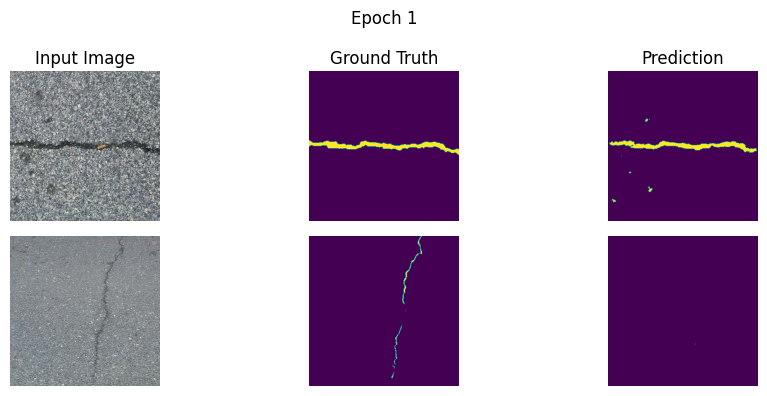

Train - Loss: 1.0901 | Dice: 0.6975 | IoU: 0.6207
        Breakdown -> total: 1.090 | ce: 0.263 | dice: 0.376 | iou: 0.433 | focal: 0.063 | boundary: 0.009 | connectivity: 0.025
Val   - Loss: 0.8799 | Dice: 0.7240 | IoU: 0.6517
        Breakdown -> total: 0.880 | ce: 0.166 | dice: 0.325 | iou: 0.391 | focal: 0.030 | boundary: 0.007 | connectivity: 0.019
Validation loss decreased (inf --> 0.879887). Saving model ...

Training completed!

Epoch 2/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=1.445, ce=0.611, dice=0.671, iou=0.429, focal=0.119, boundary=0.007, connectivity=0.017]


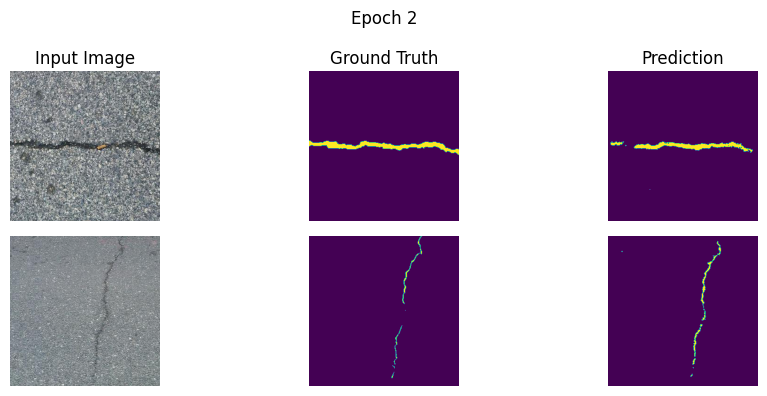

Train - Loss: 0.8077 | Dice: 0.7994 | IoU: 0.7122
        Breakdown -> total: 0.808 | ce: 0.167 | dice: 0.279 | iou: 0.347 | focal: 0.036 | boundary: 0.009 | connectivity: 0.020
Val   - Loss: 0.9383 | Dice: 0.7202 | IoU: 0.6445
        Breakdown -> total: 0.938 | ce: 0.258 | dice: 0.305 | iou: 0.376 | focal: 0.050 | boundary: 0.006 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 3/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.951, ce=0.166, dice=0.670, iou=0.414, focal=0.050, boundary=0.019, connectivity=0.023]


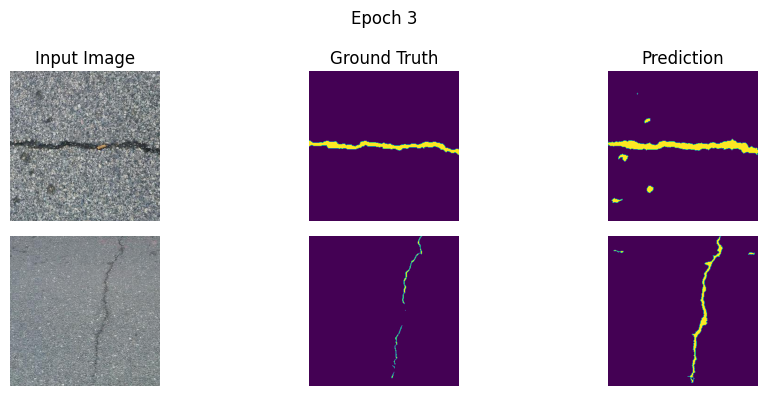

Train - Loss: 0.7534 | Dice: 0.8143 | IoU: 0.7285
        Breakdown -> total: 0.753 | ce: 0.156 | dice: 0.252 | iou: 0.324 | focal: 0.036 | boundary: 0.009 | connectivity: 0.020
Val   - Loss: 0.7531 | Dice: 0.7737 | IoU: 0.6921
        Breakdown -> total: 0.753 | ce: 0.128 | dice: 0.250 | iou: 0.330 | focal: 0.043 | boundary: 0.015 | connectivity: 0.026
Validation loss decreased (0.879887 --> 0.753138). Saving model ...

Training completed!

Epoch 4/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.685, ce=0.159, dice=0.843, iou=0.291, focal=0.033, boundary=0.009, connectivity=0.020]


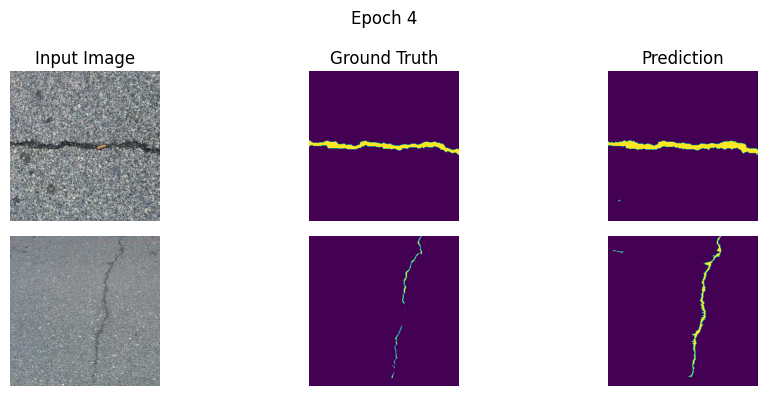

Train - Loss: 0.7076 | Dice: 0.8266 | IoU: 0.7426
        Breakdown -> total: 0.708 | ce: 0.141 | dice: 0.237 | iou: 0.309 | focal: 0.033 | boundary: 0.009 | connectivity: 0.019
Val   - Loss: 0.7054 | Dice: 0.7867 | IoU: 0.7072
        Breakdown -> total: 0.705 | ce: 0.130 | dice: 0.235 | iou: 0.312 | focal: 0.034 | boundary: 0.011 | connectivity: 0.021
Validation loss decreased (0.753138 --> 0.705431). Saving model ...

Training completed!

Epoch 5/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=1.031, ce=0.370, dice=0.808, iou=0.367, focal=0.067, boundary=0.001, connectivity=0.013]


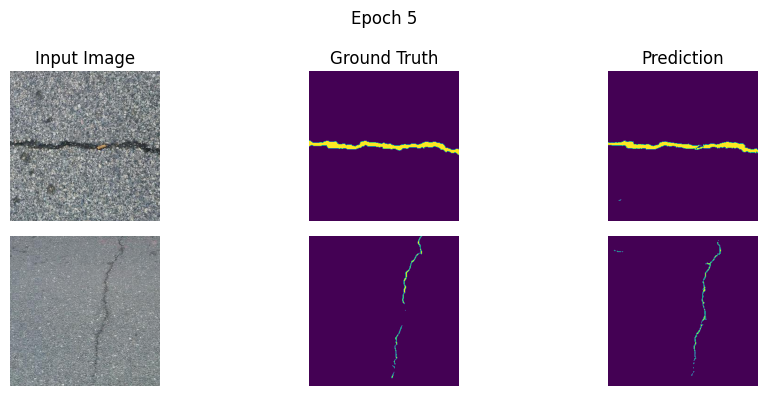

Train - Loss: 0.6728 | Dice: 0.8397 | IoU: 0.7566
        Breakdown -> total: 0.673 | ce: 0.131 | dice: 0.224 | iou: 0.297 | focal: 0.030 | boundary: 0.009 | connectivity: 0.018
Val   - Loss: 0.7045 | Dice: 0.7907 | IoU: 0.7113
        Breakdown -> total: 0.704 | ce: 0.173 | dice: 0.224 | iou: 0.301 | focal: 0.034 | boundary: 0.005 | connectivity: 0.014
Validation loss decreased (0.705431 --> 0.704451). Saving model ...

Training completed!

Epoch 6/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.631, ce=0.103, dice=0.852, iou=0.293, focal=0.023, boundary=0.008, connectivity=0.015]


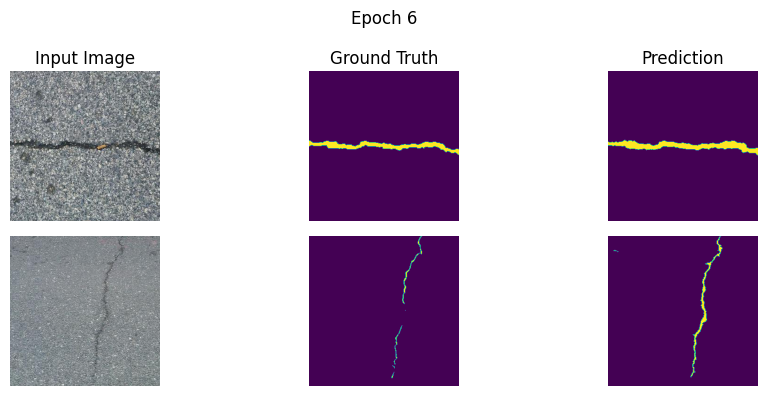

Train - Loss: 0.6603 | Dice: 0.8404 | IoU: 0.7590
        Breakdown -> total: 0.660 | ce: 0.127 | dice: 0.220 | iou: 0.293 | focal: 0.030 | boundary: 0.009 | connectivity: 0.019
Val   - Loss: 0.6559 | Dice: 0.8087 | IoU: 0.7292
        Breakdown -> total: 0.656 | ce: 0.130 | dice: 0.208 | iou: 0.286 | focal: 0.034 | boundary: 0.011 | connectivity: 0.020
Validation loss decreased (0.704451 --> 0.655866). Saving model ...

Training completed!

Epoch 7/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.514, ce=0.113, dice=0.895, iou=0.218, focal=0.024, boundary=0.007, connectivity=0.020]


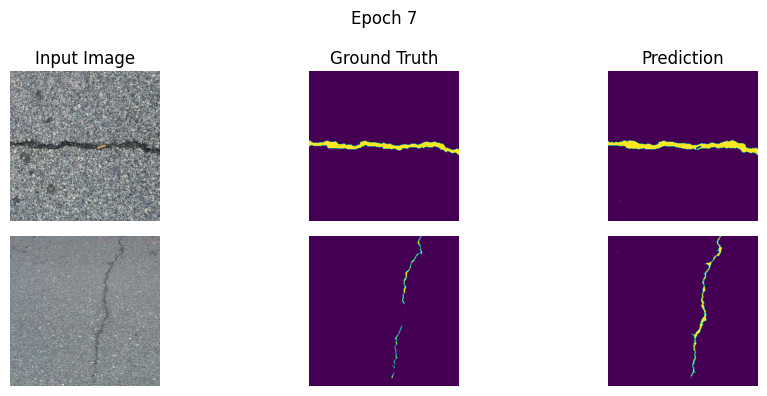

KeyboardInterrupt: 

In [22]:
# Connectivity loss
from scipy.ndimage import distance_transform_edt
from kornia.morphology import erosion, dilation
def dice_loss(pred_probs, target_one_hot, smooth=1.):
    intersection = (pred_probs * target_one_hot).sum(dim=(2, 3))
    total = pred_probs.sum(dim=(2, 3)) + target_one_hot.sum(dim=(2, 3))
    
    dice = (2. * intersection + smooth) / (total + smooth)
    return 1 - dice.mean()
    
def iou_loss(pred_probs, target_one_hot, smooth=1.):
    intersection = (pred_probs * target_one_hot).sum(dim=(2, 3))
    union = (pred_probs + target_one_hot - pred_probs * target_one_hot).sum(dim=(2, 3))

    iou = (intersection + smooth) / (union + smooth)
    return 1 - iou.mean()

def focal_loss(pred_logits, target_long, alpha=0.7, gamma=2.0):
    ce_loss = F.cross_entropy(pred_logits, target_long, reduction='none')
    pt = torch.exp(-ce_loss)
    focal_loss = alpha * (1 - pt) ** gamma * ce_loss
    return focal_loss.mean()
class UltimateCombinedLoss(nn.Module):
    # ... (the __init__ and creative loss methods are the same as before) ...
    def __init__(self, ce_weight=1.0, dice_weight=0.8, iou_weight=1.0, 
                 focal_weight=0.5, boundary_weight=1.5, connectivity_weight=2.0,
                 class_weights=[0.2, 0.8], device='cuda'):
        super().__init__()
        self.ce_weight = ce_weight
        self.dice_weight = dice_weight
        self.iou_weight = iou_weight
        self.focal_weight = focal_weight
        self.boundary_weight = boundary_weight
        self.connectivity_weight = connectivity_weight
        self.device = device
        self.ce = nn.CrossEntropyLoss(weight=torch.tensor(class_weights, device=self.device))
        self.kernel = torch.ones(5, 5, device=self.device)

    def get_relaxed_boundary_loss(self, pred_probs, target_one_hot):
        pred_crack = pred_probs[:, 1:2]
        target_crack = target_one_hot[:, 1:2]
        boundary_zone = dilation(target_crack, self.kernel)
        target_dist_map = torch.from_numpy(distance_transform_edt(target_crack.cpu().numpy() == 0)).float().to(self.device)
        error_map = torch.abs(pred_crack - target_crack)
        distance_weighted_error = error_map * target_dist_map * boundary_zone
        return distance_weighted_error.mean()

    def get_soft_connectivity_loss(self, pred_probs):
        pred_crack = pred_probs[:, 1:2]
        eroded_pred = erosion(pred_crack, self.kernel)
        breakage_map = pred_crack - eroded_pred
        return torch.mean(breakage_map)

    def forward(self, pred_logits, target, return_components=False):
        target_long = target.long()

        pred_probs = F.softmax(pred_logits, dim=1)
        target_one_hot = F.one_hot(target_long, num_classes=pred_logits.shape[1]).permute(0, 3, 1, 2).float()

        loss_ce = self.ce(pred_logits, target_long)
        loss_focal = focal_loss(pred_logits, target_long)
        
        # These now receive the one-hot tensor and will not error
        loss_dice = dice_loss(pred_probs, target_one_hot)
        loss_iou = iou_loss(pred_probs, target_one_hot)
        
        loss_boundary = self.get_relaxed_boundary_loss(pred_probs, target_one_hot)
        loss_connectivity = self.get_soft_connectivity_loss(pred_probs)

        total_loss = (self.ce_weight * loss_ce + 
                      self.dice_weight * loss_dice +
                      self.iou_weight * loss_iou + 
                      self.focal_weight * loss_focal +
                      self.boundary_weight * loss_boundary +
                      self.connectivity_weight * loss_connectivity)
        
        if return_components:
            components = {
                'total_loss': total_loss.item(), 'ce_loss': loss_ce.item(),
                'dice_loss': loss_dice.item(), 'iou_loss': loss_iou.item(),
                'focal_loss': loss_focal.item(), 'boundary_loss': loss_boundary.item(),
                'connectivity_loss': loss_connectivity.item()
            }
            return total_loss, components
            
        return total_loss
        
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

batch_size = 8
num_epochs = 100
lr = 1e-3

# Create datasets
train_dataset = UDTIRICrackDataset(split='train', transform=get_transforms(train=True))
val_dataset = UDTIRICrackDataset(split='val', transform=get_transforms(train=False))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Create model
model = LM_Net(channel=3, n_classes=2)  
# model = nn.DataParallel(model)
model = model.to(device)

# Loss and optimizer
criterion = UltimateCombinedLoss().to(device)
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

early_stopping = EarlyStopping(patience=10, verbose=True, path='best_model_checkpoint.pt')
    # Training loop
for epoch in range(num_epochs):
    print(f'\nEpoch {epoch+1}/{num_epochs}')
    train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_metrics = validate(model, val_loader, criterion, device, epoch + 1)
    

    train_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in train_metrics.items() if '_loss' in key])
    val_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in val_metrics.items() if '_loss' in key])

    print(f'Train - Loss: {train_metrics["loss"]:.4f} | Dice: {train_metrics["dice"]:.4f} | IoU: {train_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {train_loss_breakdown}')
    
    print(f'Val   - Loss: {val_metrics["loss"]:.4f} | Dice: {val_metrics["dice"]:.4f} | IoU: {val_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {val_loss_breakdown}')
    
    scheduler.step(val_metrics['loss'])

    early_stopping(val_metrics['loss'], model)
    if early_stopping.early_stop:
        print("Early stopping triggered.")
        break
    print("\nTraining completed!")


In [21]:
def tversky_loss(pred, target, alpha=0.3, beta=0.7, smooth=1.0):
    """
    Tversky loss với beta > alpha sẽ ưu tiên recall hơn precision
    """
    pred = torch.softmax(pred, dim=1)
    target_one_hot = torch.zeros_like(pred)
    target_one_hot.scatter_(1, target.unsqueeze(1), 1)
    
    pred_flat = pred.view(-1, pred.size(1))
    target_flat = target_one_hot.view(-1, target_one_hot.size(1))
    
    tp = (pred_flat * target_flat).sum(0)
    fp = ((1-target_flat) * pred_flat).sum(0)
    fn = (target_flat * (1-pred_flat)).sum(0)
    
    tversky = (tp + smooth) / (tp + alpha*fp + beta*fn + smooth)
    return 1 - tversky.mean()

class ImprovedCombinedLoss(nn.Module):
    def __init__(self, device='cuda'):
        super().__init__()
        class_weights = torch.tensor([0.3, 0.7])
        self.ce = nn.CrossEntropyLoss(weight=class_weights)
        self.ce_weight = 1.0
        self.tversky_weight = 1.5  # Tversky loss với beta > alpha ưu tiên recall
        self.focal_weight = 0.5
        self.iou_weight = 1.0
        self.dice_weight = 0.8
        
    def forward(self, pred, target, return_components=False):
        target = target.long()
        ce_loss = self.ce(pred, target)
        focal_loss_val = focal_loss(pred, target)
        iou_loss = iou_loss(pred, target)
        tversky_loss_val = tversky_loss(pred, target, alpha=0.3, beta=0.7)
        # dice_loss = dice_loss(pred, target)
        total_loss = (self.ce_weight * ce_loss + 
                      self.tversky_weight * tversky_loss_val + 
                      self.focal_weight * focal_loss_val+
                     self.iou_weight* iou_loss)
        
        if return_components:
            return total_loss, {
                'ce_loss': ce_loss.item(),
                'tversky_loss': tversky_loss_val.item(),
                'focal_loss': focal_loss_val.item(),
                # 'dice_loss': dice_loss.item(),
                'iou_loss': iou_loss.item(),
                'total_loss': total_loss.item(),
            }
        return total_loss


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

batch_size = 8
num_epochs = 100
lr = 1e-3

# Create datasets
train_dataset = UDTIRICrackDataset(split='train', transform=get_transforms(train=True))
val_dataset = UDTIRICrackDataset(split='val', transform=get_transforms(train=False))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Create model
model = LM_Net(channel=3, n_classes=2)  
# model = nn.DataParallel(model)
model = model.to(device)

# Loss and optimizer
criterion = ImprovedCombinedLoss(device='cuda').to(device)
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

early_stopping = EarlyStopping(patience=10, verbose=True, path='best_model_checkpoint.pt')
    # Training loop
for epoch in range(num_epochs):
    print(f'\nEpoch {epoch+1}/{num_epochs}')
    train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_metrics = validate(model, val_loader, criterion, device, epoch + 1)
    

    train_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in train_metrics.items() if '_loss' in key])
    val_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in val_metrics.items() if '_loss' in key])

    print(f'Train - Loss: {train_metrics["loss"]:.4f} | Dice: {train_metrics["dice"]:.4f} | IoU: {train_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {train_loss_breakdown}')
    
    print(f'Val   - Loss: {val_metrics["loss"]:.4f} | Dice: {val_metrics["dice"]:.4f} | IoU: {val_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {val_loss_breakdown}')
    
    scheduler.step(val_metrics['loss'])

    early_stopping(val_metrics['loss'], model)
    if early_stopping.early_stop:
        print("Early stopping triggered.")
        break
    print("\nTraining completed!")


Using device: cuda


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:87: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Epoch 1/100


Training:   0%|          | 0/188 [00:01<?, ?it/s]


UnboundLocalError: cannot access local variable 'iou_loss' where it is not associated with a value


Epoch 1/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.883, ce=0.314, dice=0.875, iou=0.273, focal=0.061, boundary=0.002, connectivity=0.013]


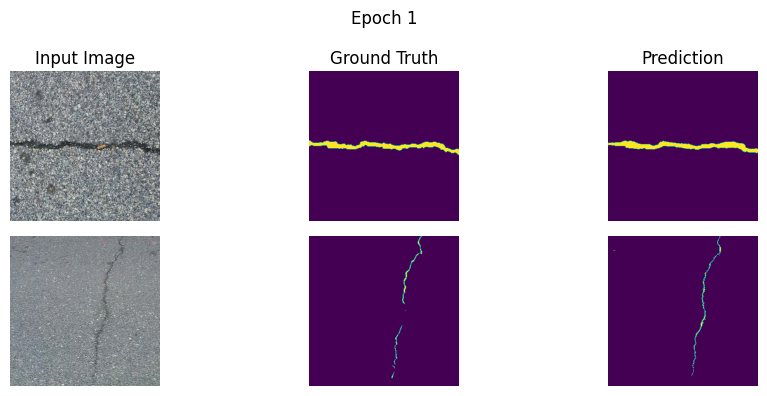

Train - Loss: 0.6738 | Dice: 0.8496 | IoU: 0.7707
        Breakdown -> total: 0.674 | ce: 0.124 | dice: 0.210 | iou: 0.284 | focal: 0.023 | boundary: 0.005 | connectivity: 0.014
Val   - Loss: 0.6551 | Dice: 0.8182 | IoU: 0.7400
        Breakdown -> total: 0.655 | ce: 0.137 | dice: 0.193 | iou: 0.270 | focal: 0.027 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (inf --> 0.655119). Saving model ...

Training completed!

Epoch 2/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.677, ce=0.110, dice=0.850, iou=0.280, focal=0.021, boundary=0.006, connectivity=0.013]


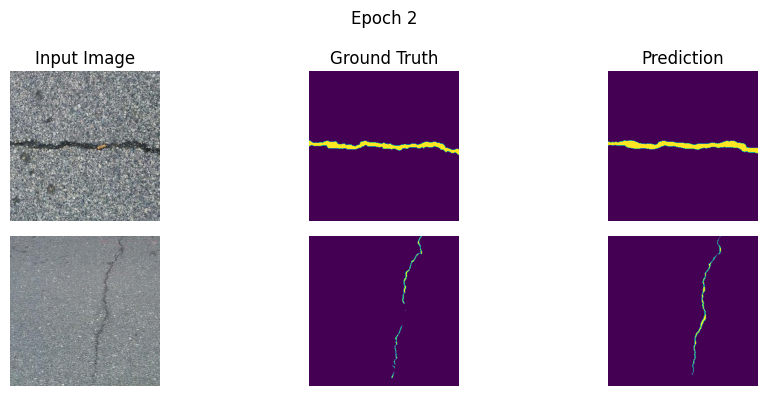

Train - Loss: 0.6696 | Dice: 0.8499 | IoU: 0.7710
        Breakdown -> total: 0.670 | ce: 0.123 | dice: 0.207 | iou: 0.281 | focal: 0.023 | boundary: 0.005 | connectivity: 0.014
Val   - Loss: 0.6671 | Dice: 0.8153 | IoU: 0.7376
        Breakdown -> total: 0.667 | ce: 0.135 | dice: 0.197 | iou: 0.275 | focal: 0.025 | boundary: 0.006 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 3/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.639, ce=0.099, dice=0.761, iou=0.297, focal=0.019, boundary=0.005, connectivity=0.011]


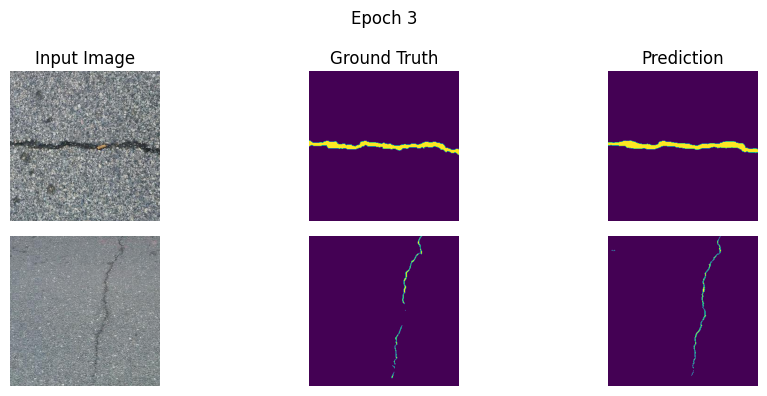

Train - Loss: 0.6606 | Dice: 0.8513 | IoU: 0.7723
        Breakdown -> total: 0.661 | ce: 0.120 | dice: 0.204 | iou: 0.278 | focal: 0.022 | boundary: 0.005 | connectivity: 0.014
Val   - Loss: 0.6608 | Dice: 0.8156 | IoU: 0.7389
        Breakdown -> total: 0.661 | ce: 0.126 | dice: 0.198 | iou: 0.274 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 4/100


Training: 100%|██████████| 188/188 [03:06<00:00,  1.01it/s, total=0.617, ce=0.087, dice=0.868, iou=0.270, focal=0.017, boundary=0.006, connectivity=0.014]


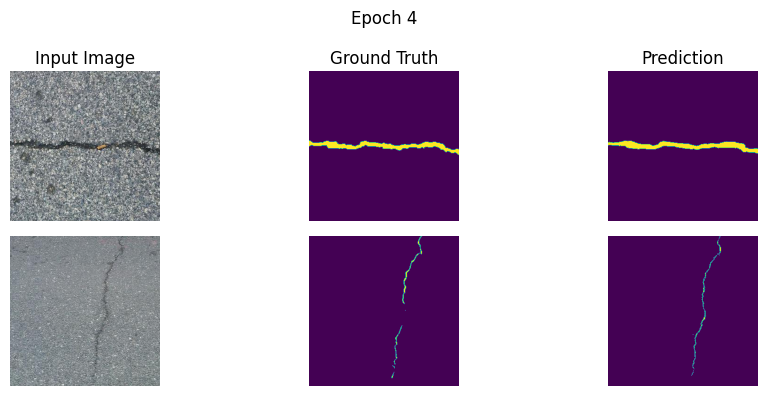

Train - Loss: 0.6549 | Dice: 0.8551 | IoU: 0.7769
        Breakdown -> total: 0.655 | ce: 0.119 | dice: 0.202 | iou: 0.275 | focal: 0.022 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6475 | Dice: 0.8178 | IoU: 0.7398
        Breakdown -> total: 0.647 | ce: 0.136 | dice: 0.193 | iou: 0.271 | focal: 0.025 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.655119 --> 0.647460). Saving model ...

Training completed!

Epoch 5/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.494, ce=0.035, dice=0.884, iou=0.244, focal=0.009, boundary=0.006, connectivity=0.012]


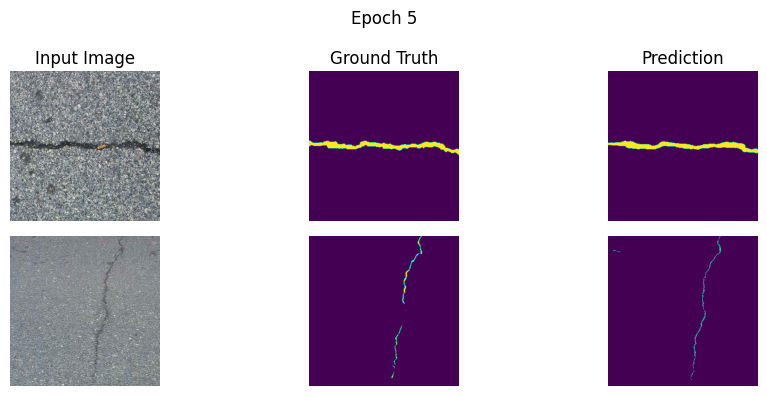

Train - Loss: 0.6509 | Dice: 0.8547 | IoU: 0.7762
        Breakdown -> total: 0.651 | ce: 0.117 | dice: 0.201 | iou: 0.274 | focal: 0.022 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6609 | Dice: 0.8096 | IoU: 0.7303
        Breakdown -> total: 0.661 | ce: 0.141 | dice: 0.202 | iou: 0.280 | focal: 0.026 | boundary: 0.004 | connectivity: 0.012
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 6/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.967, ce=0.420, dice=0.769, iou=0.246, focal=0.079, boundary=0.003, connectivity=0.013]


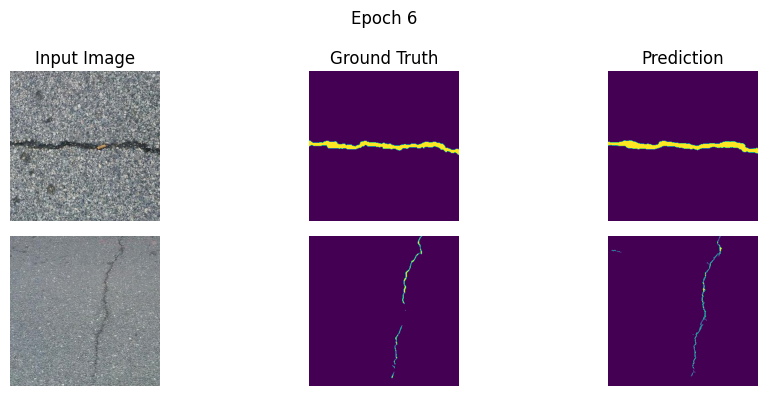

Train - Loss: 0.6491 | Dice: 0.8558 | IoU: 0.7774
        Breakdown -> total: 0.649 | ce: 0.117 | dice: 0.199 | iou: 0.273 | focal: 0.022 | boundary: 0.005 | connectivity: 0.014
Val   - Loss: 0.6346 | Dice: 0.8278 | IoU: 0.7513
        Breakdown -> total: 0.635 | ce: 0.121 | dice: 0.186 | iou: 0.263 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.647460 --> 0.634643). Saving model ...

Training completed!

Epoch 7/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.690, ce=0.152, dice=0.871, iou=0.282, focal=0.026, boundary=0.005, connectivity=0.013]


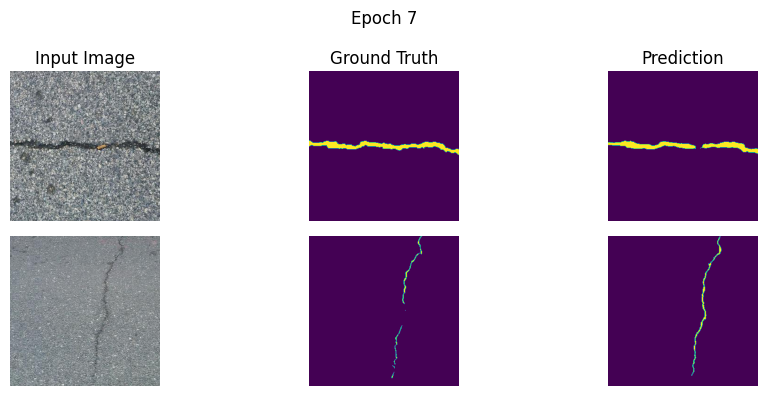

Train - Loss: 0.6514 | Dice: 0.8554 | IoU: 0.7772
        Breakdown -> total: 0.651 | ce: 0.119 | dice: 0.200 | iou: 0.273 | focal: 0.022 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6655 | Dice: 0.8167 | IoU: 0.7388
        Breakdown -> total: 0.666 | ce: 0.158 | dice: 0.191 | iou: 0.268 | focal: 0.030 | boundary: 0.004 | connectivity: 0.012
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 8/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=1.190, ce=0.541, dice=0.798, iou=0.258, focal=0.106, boundary=0.003, connectivity=0.021]


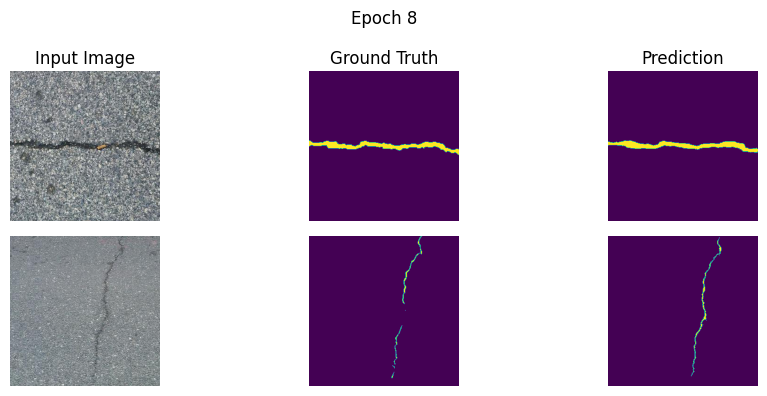

Train - Loss: 0.6440 | Dice: 0.8566 | IoU: 0.7783
        Breakdown -> total: 0.644 | ce: 0.117 | dice: 0.196 | iou: 0.269 | focal: 0.022 | boundary: 0.005 | connectivity: 0.014
Val   - Loss: 0.6497 | Dice: 0.8164 | IoU: 0.7388
        Breakdown -> total: 0.650 | ce: 0.144 | dice: 0.192 | iou: 0.269 | focal: 0.027 | boundary: 0.004 | connectivity: 0.012
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 9/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.638, ce=0.144, dice=0.831, iou=0.259, focal=0.026, boundary=0.004, connectivity=0.012]


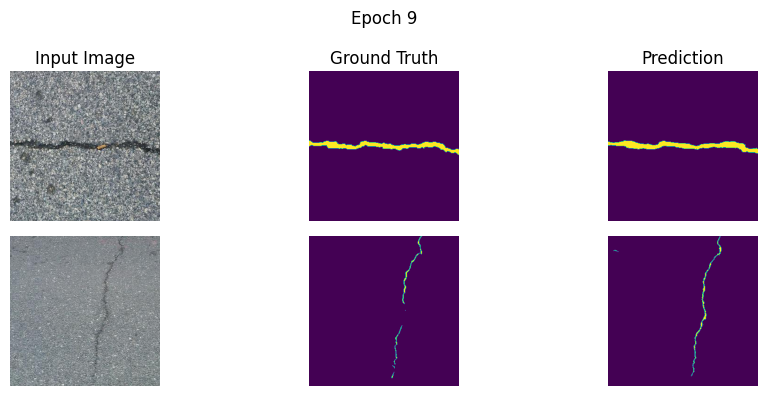

Train - Loss: 0.6377 | Dice: 0.8576 | IoU: 0.7800
        Breakdown -> total: 0.638 | ce: 0.113 | dice: 0.196 | iou: 0.269 | focal: 0.021 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6925 | Dice: 0.8094 | IoU: 0.7302
        Breakdown -> total: 0.692 | ce: 0.170 | dice: 0.199 | iou: 0.276 | focal: 0.033 | boundary: 0.005 | connectivity: 0.012
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 10/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.711, ce=0.102, dice=0.715, iou=0.342, focal=0.021, boundary=0.007, connectivity=0.010]


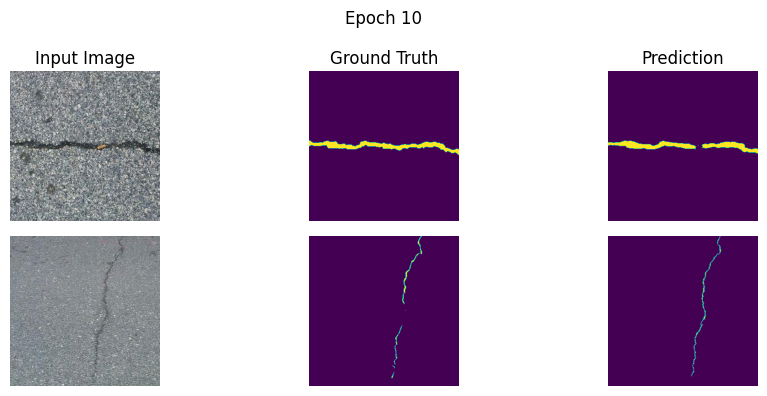

Train - Loss: 0.6382 | Dice: 0.8553 | IoU: 0.7778
        Breakdown -> total: 0.638 | ce: 0.115 | dice: 0.195 | iou: 0.268 | focal: 0.021 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6247 | Dice: 0.8261 | IoU: 0.7496
        Breakdown -> total: 0.625 | ce: 0.129 | dice: 0.183 | iou: 0.259 | focal: 0.024 | boundary: 0.004 | connectivity: 0.013
Validation loss decreased (0.634643 --> 0.624666). Saving model ...

Training completed!

Epoch 11/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.447, ce=0.069, dice=0.911, iou=0.189, focal=0.010, boundary=0.002, connectivity=0.014]


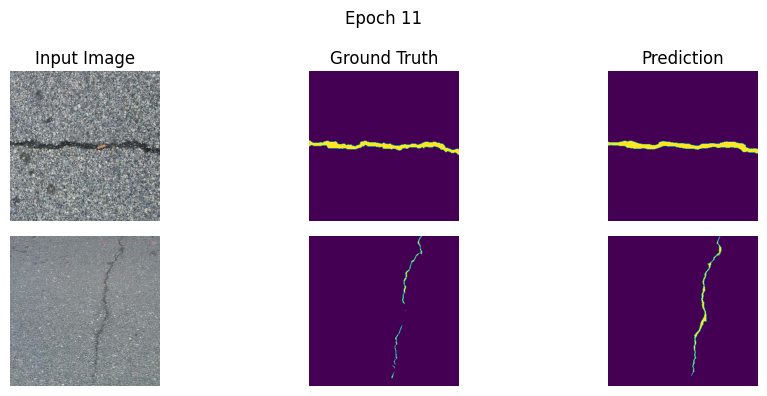

Train - Loss: 0.6314 | Dice: 0.8587 | IoU: 0.7811
        Breakdown -> total: 0.631 | ce: 0.113 | dice: 0.193 | iou: 0.266 | focal: 0.021 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6324 | Dice: 0.8298 | IoU: 0.7529
        Breakdown -> total: 0.632 | ce: 0.117 | dice: 0.184 | iou: 0.261 | focal: 0.022 | boundary: 0.006 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 12/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.812, ce=0.251, dice=0.837, iou=0.266, focal=0.044, boundary=0.005, connectivity=0.016]


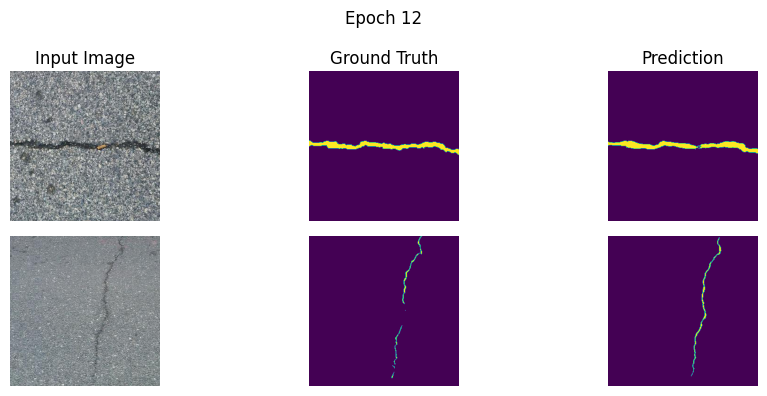

Train - Loss: 0.6316 | Dice: 0.8575 | IoU: 0.7802
        Breakdown -> total: 0.632 | ce: 0.112 | dice: 0.193 | iou: 0.266 | focal: 0.021 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6342 | Dice: 0.8169 | IoU: 0.7408
        Breakdown -> total: 0.634 | ce: 0.144 | dice: 0.188 | iou: 0.263 | focal: 0.027 | boundary: 0.004 | connectivity: 0.012
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 13/100


Training: 100%|██████████| 188/188 [03:06<00:00,  1.01it/s, total=0.432, ce=0.019, dice=0.866, iou=0.275, focal=0.005, boundary=0.003, connectivity=0.007]


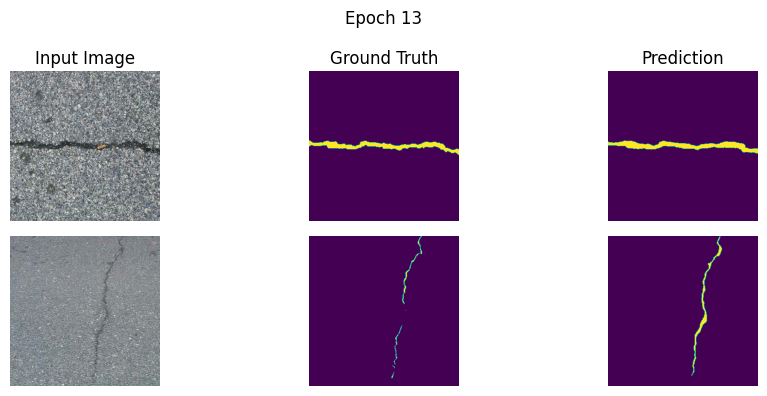

Train - Loss: 0.6264 | Dice: 0.8610 | IoU: 0.7838
        Breakdown -> total: 0.626 | ce: 0.111 | dice: 0.192 | iou: 0.265 | focal: 0.020 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6384 | Dice: 0.8388 | IoU: 0.7624
        Breakdown -> total: 0.638 | ce: 0.107 | dice: 0.175 | iou: 0.251 | focal: 0.023 | boundary: 0.007 | connectivity: 0.015
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 14/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.405, ce=0.040, dice=0.871, iou=0.257, focal=0.007, boundary=0.001, connectivity=0.006]


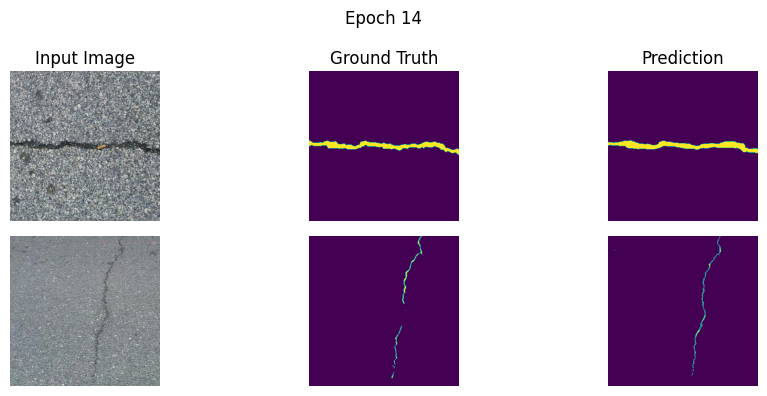

Train - Loss: 0.6292 | Dice: 0.8600 | IoU: 0.7834
        Breakdown -> total: 0.629 | ce: 0.110 | dice: 0.192 | iou: 0.265 | focal: 0.020 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6259 | Dice: 0.8196 | IoU: 0.7445
        Breakdown -> total: 0.626 | ce: 0.127 | dice: 0.191 | iou: 0.265 | focal: 0.023 | boundary: 0.005 | connectivity: 0.012
EarlyStopping counter: 4 out of 10

Training completed!

Epoch 15/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.910, ce=0.247, dice=0.675, iou=0.360, focal=0.044, boundary=0.006, connectivity=0.011]


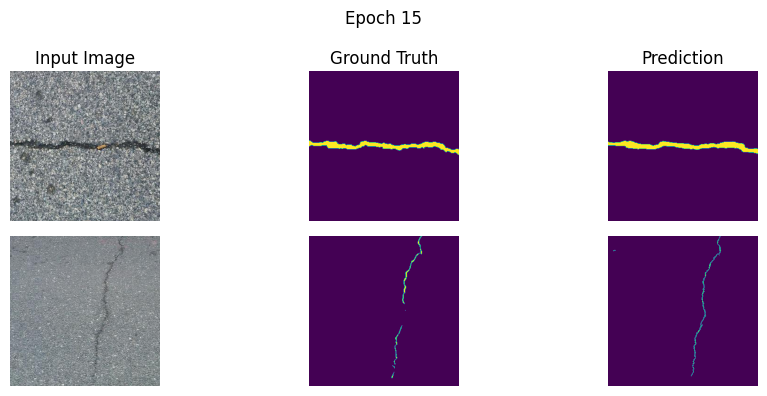

Train - Loss: 0.6154 | Dice: 0.8638 | IoU: 0.7881
        Breakdown -> total: 0.615 | ce: 0.108 | dice: 0.187 | iou: 0.260 | focal: 0.020 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6187 | Dice: 0.8285 | IoU: 0.7525
        Breakdown -> total: 0.619 | ce: 0.123 | dice: 0.181 | iou: 0.256 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.624666 --> 0.618726). Saving model ...

Training completed!

Epoch 16/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.573, ce=0.097, dice=0.937, iou=0.191, focal=0.018, boundary=0.005, connectivity=0.017]


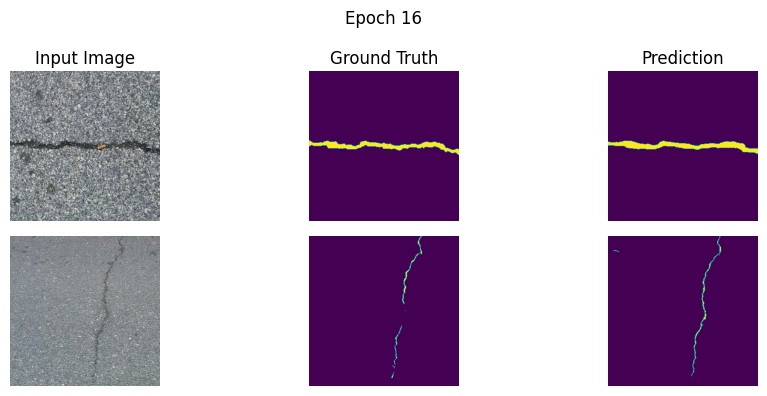

Train - Loss: 0.6131 | Dice: 0.8651 | IoU: 0.7893
        Breakdown -> total: 0.613 | ce: 0.107 | dice: 0.186 | iou: 0.258 | focal: 0.020 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6262 | Dice: 0.8342 | IoU: 0.7587
        Breakdown -> total: 0.626 | ce: 0.104 | dice: 0.181 | iou: 0.257 | focal: 0.021 | boundary: 0.006 | connectivity: 0.014
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 17/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.514, ce=0.058, dice=0.803, iou=0.292, focal=0.010, boundary=0.003, connectivity=0.008]


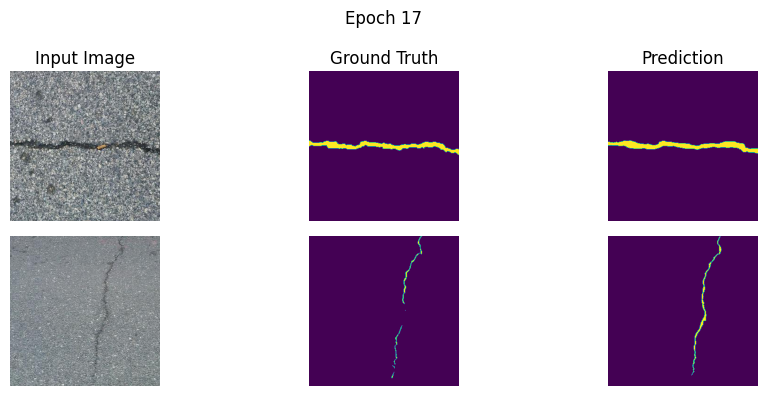

Train - Loss: 0.6098 | Dice: 0.8651 | IoU: 0.7892
        Breakdown -> total: 0.610 | ce: 0.104 | dice: 0.185 | iou: 0.258 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6234 | Dice: 0.8335 | IoU: 0.7573
        Breakdown -> total: 0.623 | ce: 0.122 | dice: 0.176 | iou: 0.251 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 18/100


Training: 100%|██████████| 188/188 [03:06<00:00,  1.01it/s, total=0.603, ce=0.104, dice=0.858, iou=0.280, focal=0.018, boundary=0.004, connectivity=0.011]


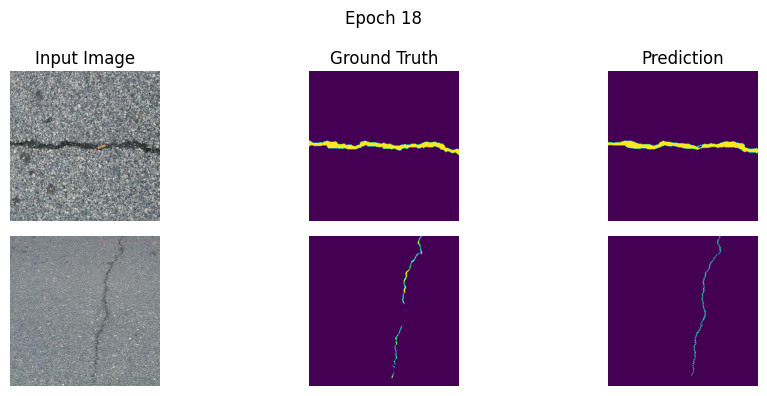

Train - Loss: 0.6139 | Dice: 0.8637 | IoU: 0.7878
        Breakdown -> total: 0.614 | ce: 0.108 | dice: 0.185 | iou: 0.258 | focal: 0.020 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6224 | Dice: 0.8206 | IoU: 0.7448
        Breakdown -> total: 0.622 | ce: 0.135 | dice: 0.187 | iou: 0.262 | focal: 0.025 | boundary: 0.004 | connectivity: 0.012
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 19/100


Training: 100%|██████████| 188/188 [03:06<00:00,  1.01it/s, total=0.609, ce=0.052, dice=0.873, iou=0.319, focal=0.012, boundary=0.005, connectivity=0.009]


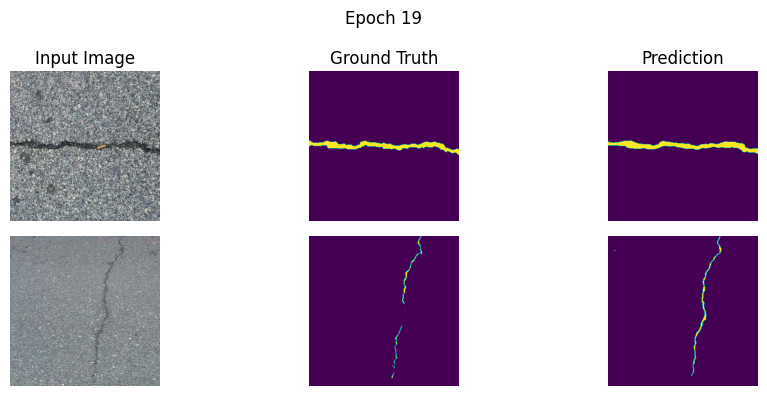

Train - Loss: 0.6077 | Dice: 0.8666 | IoU: 0.7908
        Breakdown -> total: 0.608 | ce: 0.105 | dice: 0.184 | iou: 0.256 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6178 | Dice: 0.8397 | IoU: 0.7642
        Breakdown -> total: 0.618 | ce: 0.109 | dice: 0.171 | iou: 0.246 | focal: 0.023 | boundary: 0.006 | connectivity: 0.014
Validation loss decreased (0.618726 --> 0.617753). Saving model ...

Training completed!

Epoch 20/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.646, ce=0.132, dice=0.919, iou=0.188, focal=0.021, boundary=0.005, connectivity=0.022]


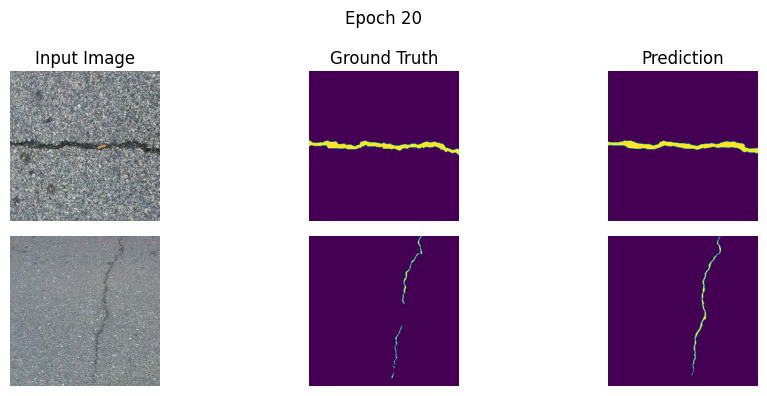

Train - Loss: 0.6061 | Dice: 0.8666 | IoU: 0.7916
        Breakdown -> total: 0.606 | ce: 0.104 | dice: 0.182 | iou: 0.255 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6181 | Dice: 0.8297 | IoU: 0.7548
        Breakdown -> total: 0.618 | ce: 0.128 | dice: 0.178 | iou: 0.252 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 21/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.581, ce=0.073, dice=0.858, iou=0.294, focal=0.014, boundary=0.004, connectivity=0.011]


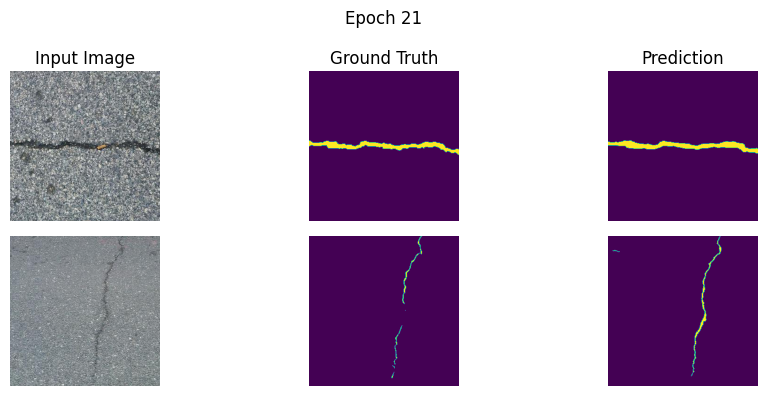

Train - Loss: 0.6064 | Dice: 0.8663 | IoU: 0.7905
        Breakdown -> total: 0.606 | ce: 0.105 | dice: 0.183 | iou: 0.256 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6226 | Dice: 0.8391 | IoU: 0.7633
        Breakdown -> total: 0.623 | ce: 0.103 | dice: 0.175 | iou: 0.250 | focal: 0.022 | boundary: 0.006 | connectivity: 0.015
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 22/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.670, ce=0.094, dice=0.849, iou=0.292, focal=0.020, boundary=0.008, connectivity=0.014]


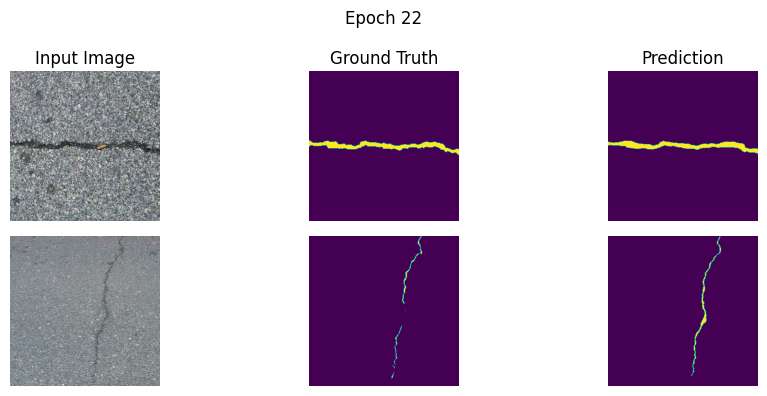

Train - Loss: 0.6090 | Dice: 0.8668 | IoU: 0.7914
        Breakdown -> total: 0.609 | ce: 0.105 | dice: 0.183 | iou: 0.256 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6147 | Dice: 0.8344 | IoU: 0.7585
        Breakdown -> total: 0.615 | ce: 0.107 | dice: 0.177 | iou: 0.253 | focal: 0.021 | boundary: 0.006 | connectivity: 0.014
Validation loss decreased (0.617753 --> 0.614688). Saving model ...

Training completed!

Epoch 23/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.838, ce=0.168, dice=0.760, iou=0.348, focal=0.028, boundary=0.007, connectivity=0.013]


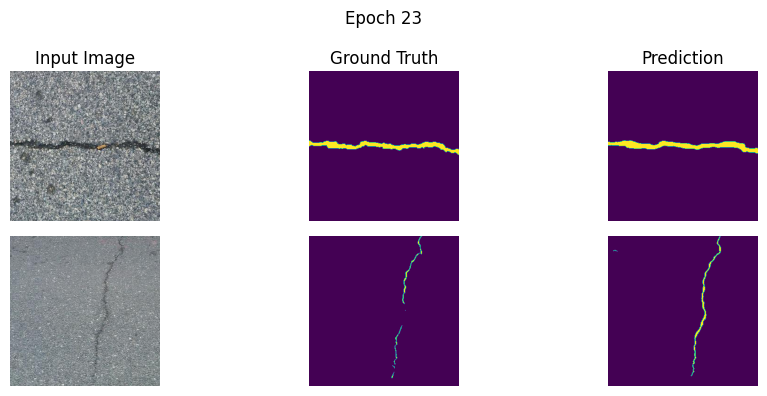

Train - Loss: 0.6064 | Dice: 0.8668 | IoU: 0.7913
        Breakdown -> total: 0.606 | ce: 0.104 | dice: 0.182 | iou: 0.255 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6340 | Dice: 0.8394 | IoU: 0.7631
        Breakdown -> total: 0.634 | ce: 0.098 | dice: 0.177 | iou: 0.253 | focal: 0.021 | boundary: 0.007 | connectivity: 0.015
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 24/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.603, ce=0.125, dice=0.922, iou=0.177, focal=0.020, boundary=0.004, connectivity=0.021]


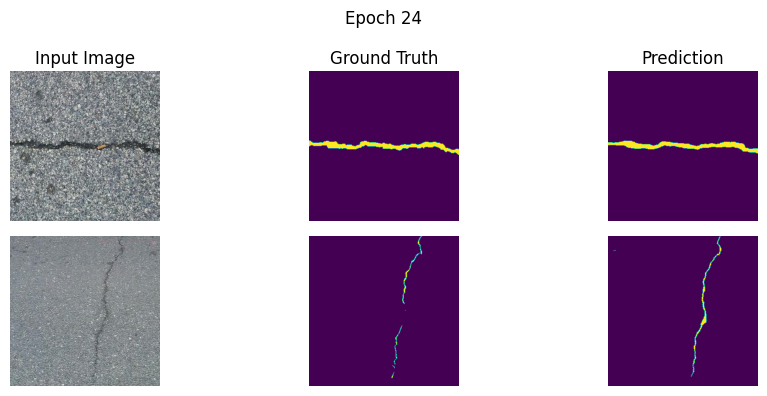

Train - Loss: 0.6050 | Dice: 0.8670 | IoU: 0.7918
        Breakdown -> total: 0.605 | ce: 0.104 | dice: 0.182 | iou: 0.254 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6134 | Dice: 0.8303 | IoU: 0.7543
        Breakdown -> total: 0.613 | ce: 0.123 | dice: 0.178 | iou: 0.254 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.614688 --> 0.613373). Saving model ...

Training completed!

Epoch 25/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.424, ce=0.037, dice=0.961, iou=0.169, focal=0.008, boundary=0.005, connectivity=0.014]


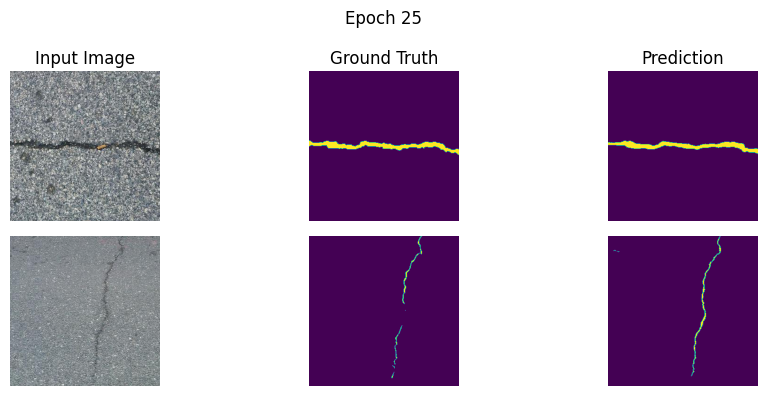

Train - Loss: 0.6038 | Dice: 0.8666 | IoU: 0.7915
        Breakdown -> total: 0.604 | ce: 0.102 | dice: 0.182 | iou: 0.255 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6149 | Dice: 0.8295 | IoU: 0.7536
        Breakdown -> total: 0.615 | ce: 0.125 | dice: 0.179 | iou: 0.255 | focal: 0.024 | boundary: 0.004 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 26/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.477, ce=0.062, dice=0.857, iou=0.236, focal=0.010, boundary=0.003, connectivity=0.010]


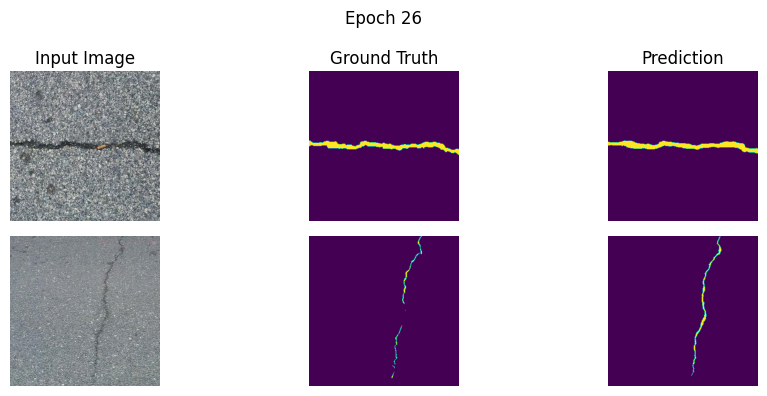

Train - Loss: 0.6014 | Dice: 0.8688 | IoU: 0.7941
        Breakdown -> total: 0.601 | ce: 0.102 | dice: 0.180 | iou: 0.253 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6299 | Dice: 0.8362 | IoU: 0.7591
        Breakdown -> total: 0.630 | ce: 0.116 | dice: 0.175 | iou: 0.251 | focal: 0.024 | boundary: 0.006 | connectivity: 0.014
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 27/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.569, ce=0.099, dice=0.904, iou=0.226, focal=0.016, boundary=0.004, connectivity=0.013]


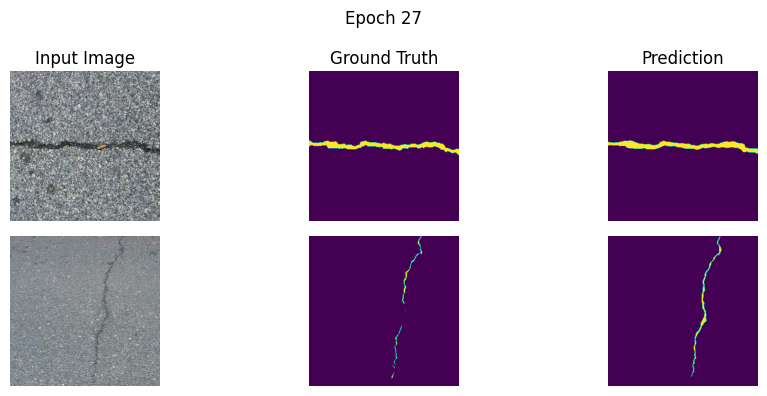

Train - Loss: 0.6020 | Dice: 0.8686 | IoU: 0.7938
        Breakdown -> total: 0.602 | ce: 0.104 | dice: 0.181 | iou: 0.253 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6152 | Dice: 0.8354 | IoU: 0.7594
        Breakdown -> total: 0.615 | ce: 0.109 | dice: 0.176 | iou: 0.252 | focal: 0.022 | boundary: 0.006 | connectivity: 0.013
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 28/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.967, ce=0.318, dice=0.723, iou=0.340, focal=0.057, boundary=0.005, connectivity=0.012]


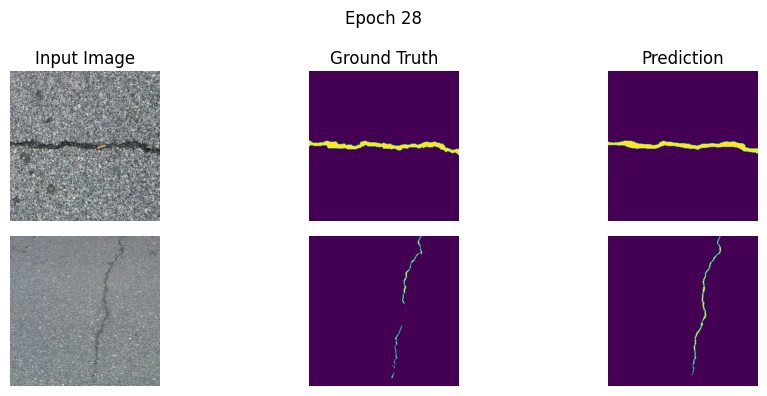

Train - Loss: 0.6042 | Dice: 0.8660 | IoU: 0.7908
        Breakdown -> total: 0.604 | ce: 0.103 | dice: 0.182 | iou: 0.254 | focal: 0.019 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6191 | Dice: 0.8276 | IoU: 0.7514
        Breakdown -> total: 0.619 | ce: 0.129 | dice: 0.180 | iou: 0.255 | focal: 0.024 | boundary: 0.004 | connectivity: 0.013
EarlyStopping counter: 4 out of 10

Training completed!

Epoch 29/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.499, ce=0.028, dice=0.908, iou=0.292, focal=0.006, boundary=0.003, connectivity=0.007]


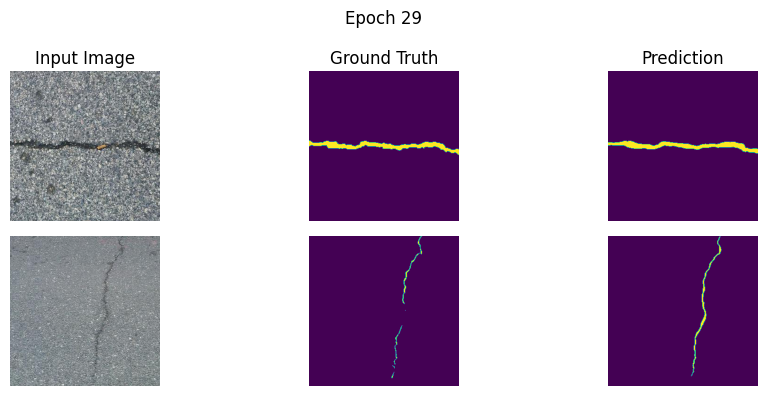

Train - Loss: 0.5966 | Dice: 0.8698 | IoU: 0.7953
        Breakdown -> total: 0.597 | ce: 0.100 | dice: 0.180 | iou: 0.252 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6083 | Dice: 0.8375 | IoU: 0.7620
        Breakdown -> total: 0.608 | ce: 0.113 | dice: 0.172 | iou: 0.247 | focal: 0.022 | boundary: 0.005 | connectivity: 0.014
Validation loss decreased (0.613373 --> 0.608348). Saving model ...

Training completed!

Epoch 30/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.531, ce=0.078, dice=0.857, iou=0.253, focal=0.014, boundary=0.004, connectivity=0.012]


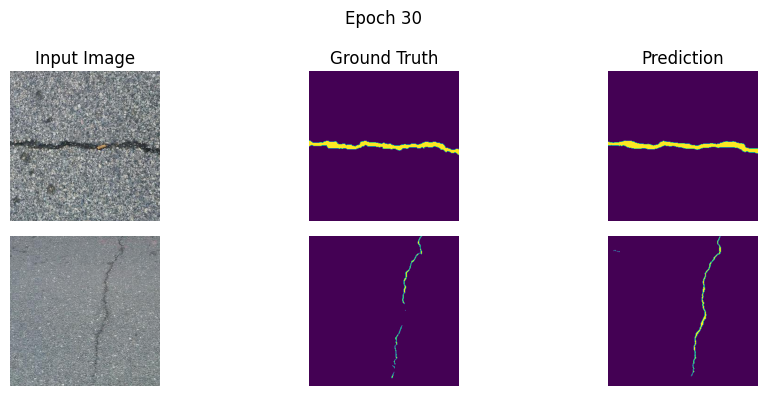

Train - Loss: 0.5919 | Dice: 0.8702 | IoU: 0.7958
        Breakdown -> total: 0.592 | ce: 0.100 | dice: 0.177 | iou: 0.249 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6059 | Dice: 0.8353 | IoU: 0.7604
        Breakdown -> total: 0.606 | ce: 0.110 | dice: 0.174 | iou: 0.249 | focal: 0.021 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.608348 --> 0.605859). Saving model ...

Training completed!

Epoch 31/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.489, ce=0.076, dice=0.950, iou=0.201, focal=0.012, boundary=0.004, connectivity=0.014]


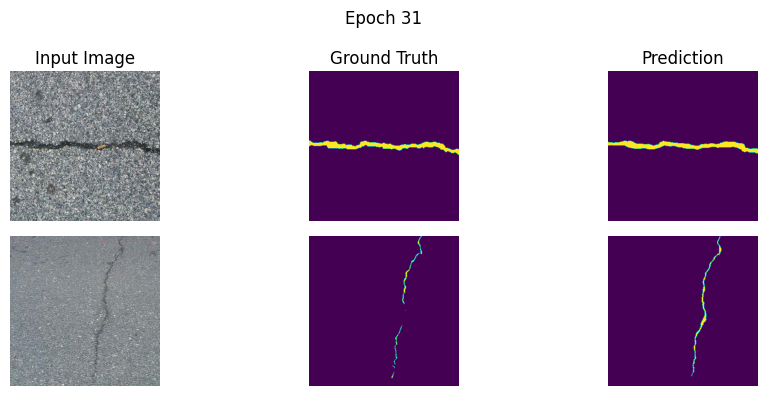

Train - Loss: 0.5898 | Dice: 0.8713 | IoU: 0.7970
        Breakdown -> total: 0.590 | ce: 0.099 | dice: 0.177 | iou: 0.249 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6056 | Dice: 0.8376 | IoU: 0.7624
        Breakdown -> total: 0.606 | ce: 0.115 | dice: 0.172 | iou: 0.246 | focal: 0.022 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.605859 --> 0.605605). Saving model ...

Training completed!

Epoch 32/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.457, ce=0.043, dice=0.923, iou=0.186, focal=0.009, boundary=0.005, connectivity=0.015]


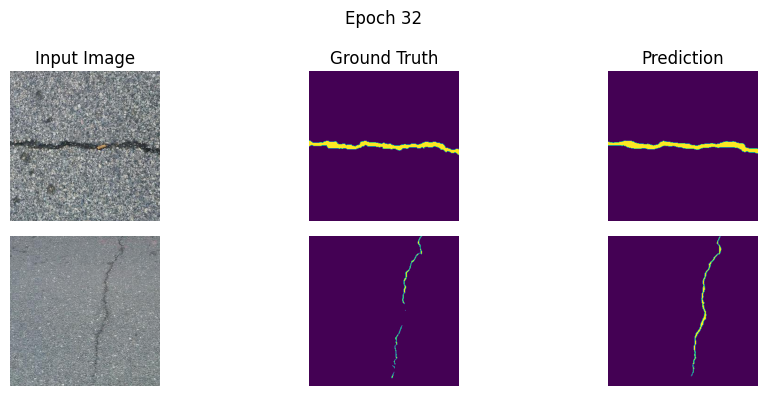

Train - Loss: 0.5910 | Dice: 0.8706 | IoU: 0.7966
        Breakdown -> total: 0.591 | ce: 0.098 | dice: 0.178 | iou: 0.250 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6082 | Dice: 0.8373 | IoU: 0.7619
        Breakdown -> total: 0.608 | ce: 0.117 | dice: 0.171 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 33/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.797, ce=0.178, dice=0.813, iou=0.318, focal=0.031, boundary=0.005, connectivity=0.014]


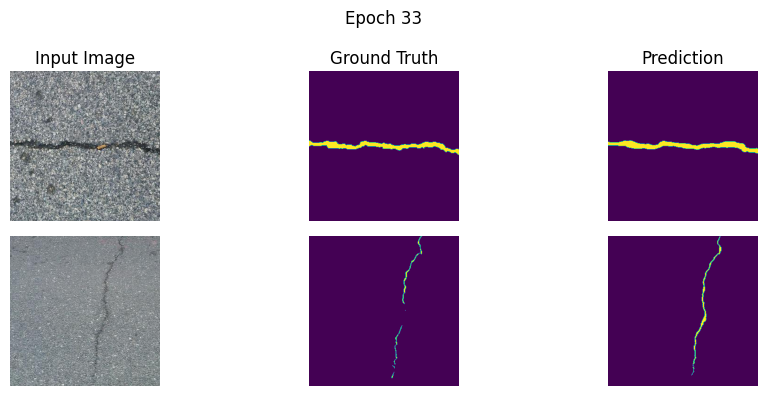

Train - Loss: 0.5922 | Dice: 0.8662 | IoU: 0.7909
        Breakdown -> total: 0.592 | ce: 0.100 | dice: 0.178 | iou: 0.250 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6098 | Dice: 0.8367 | IoU: 0.7618
        Breakdown -> total: 0.610 | ce: 0.108 | dice: 0.173 | iou: 0.247 | focal: 0.022 | boundary: 0.006 | connectivity: 0.014
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 34/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.501, ce=0.050, dice=0.836, iou=0.278, focal=0.010, boundary=0.004, connectivity=0.009]


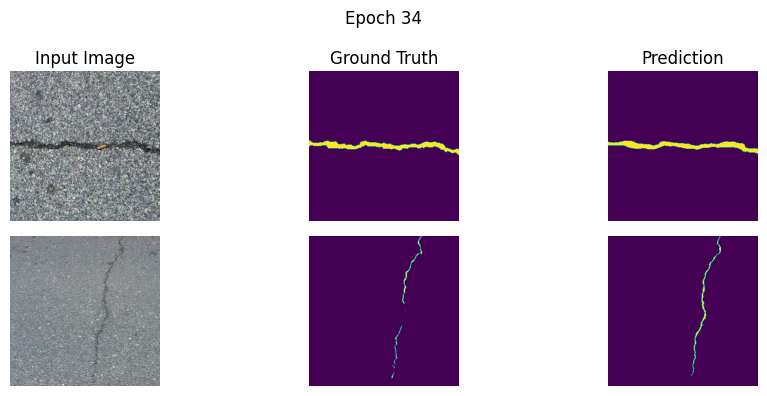

Train - Loss: 0.5917 | Dice: 0.8697 | IoU: 0.7947
        Breakdown -> total: 0.592 | ce: 0.099 | dice: 0.178 | iou: 0.250 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6136 | Dice: 0.8319 | IoU: 0.7558
        Breakdown -> total: 0.614 | ce: 0.121 | dice: 0.177 | iou: 0.252 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 35/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.684, ce=0.140, dice=0.876, iou=0.225, focal=0.023, boundary=0.005, connectivity=0.020]


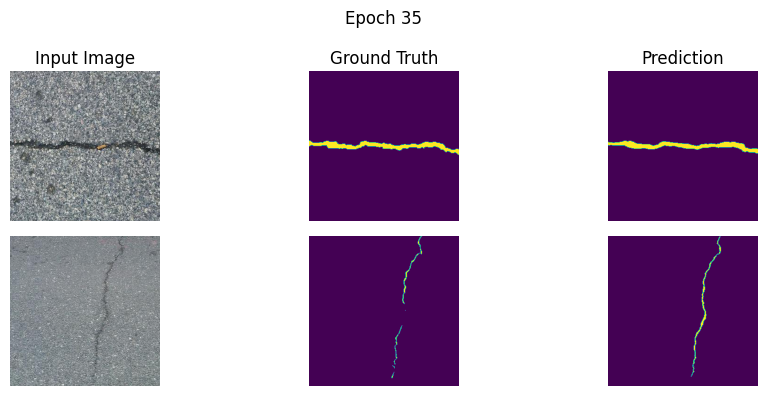

Train - Loss: 0.5921 | Dice: 0.8696 | IoU: 0.7951
        Breakdown -> total: 0.592 | ce: 0.100 | dice: 0.177 | iou: 0.249 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6089 | Dice: 0.8364 | IoU: 0.7606
        Breakdown -> total: 0.609 | ce: 0.119 | dice: 0.172 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 4 out of 10

Training completed!

Epoch 36/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.634, ce=0.069, dice=0.846, iou=0.333, focal=0.016, boundary=0.005, connectivity=0.008]


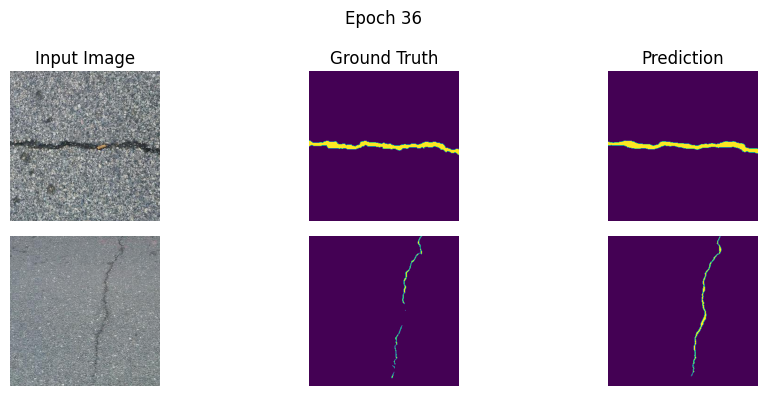

Train - Loss: 0.5863 | Dice: 0.8734 | IoU: 0.7996
        Breakdown -> total: 0.586 | ce: 0.097 | dice: 0.176 | iou: 0.247 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6077 | Dice: 0.8362 | IoU: 0.7606
        Breakdown -> total: 0.608 | ce: 0.117 | dice: 0.172 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 5 out of 10

Training completed!

Epoch 37/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.426, ce=0.043, dice=0.950, iou=0.140, focal=0.012, boundary=0.005, connectivity=0.016]


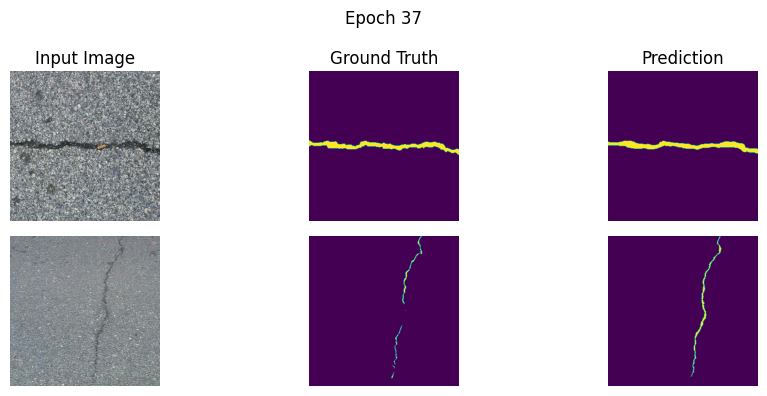

Train - Loss: 0.5843 | Dice: 0.8732 | IoU: 0.7992
        Breakdown -> total: 0.584 | ce: 0.097 | dice: 0.175 | iou: 0.246 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6115 | Dice: 0.8378 | IoU: 0.7619
        Breakdown -> total: 0.612 | ce: 0.110 | dice: 0.173 | iou: 0.248 | focal: 0.022 | boundary: 0.006 | connectivity: 0.014
EarlyStopping counter: 6 out of 10

Training completed!

Epoch 38/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.579, ce=0.130, dice=0.884, iou=0.239, focal=0.023, boundary=0.003, connectivity=0.013]


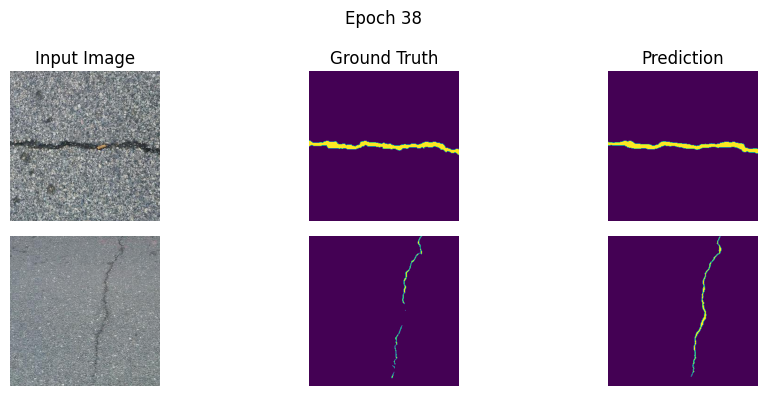

Train - Loss: 0.5846 | Dice: 0.8721 | IoU: 0.7984
        Breakdown -> total: 0.585 | ce: 0.097 | dice: 0.175 | iou: 0.246 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6100 | Dice: 0.8364 | IoU: 0.7606
        Breakdown -> total: 0.610 | ce: 0.120 | dice: 0.171 | iou: 0.246 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 7 out of 10

Training completed!

Epoch 39/100


Training: 100%|██████████| 188/188 [03:06<00:00,  1.01it/s, total=0.656, ce=0.144, dice=0.744, iou=0.273, focal=0.022, boundary=0.005, connectivity=0.011]


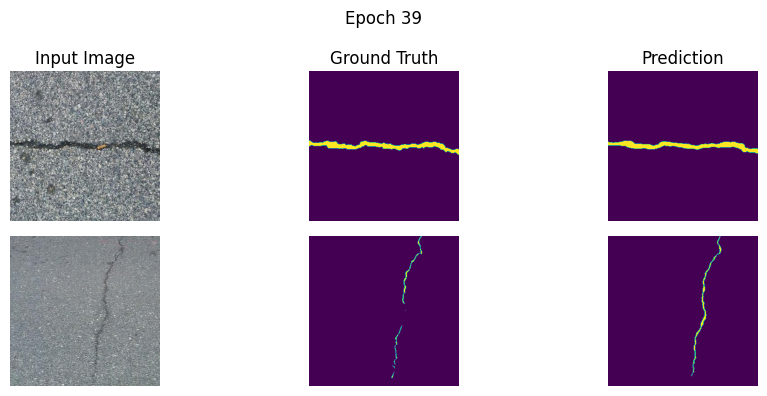

Train - Loss: 0.5826 | Dice: 0.8724 | IoU: 0.7992
        Breakdown -> total: 0.583 | ce: 0.097 | dice: 0.173 | iou: 0.244 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6093 | Dice: 0.8376 | IoU: 0.7622
        Breakdown -> total: 0.609 | ce: 0.116 | dice: 0.171 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 8 out of 10

Training completed!

Epoch 40/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.674, ce=0.145, dice=0.856, iou=0.256, focal=0.026, boundary=0.006, connectivity=0.015]


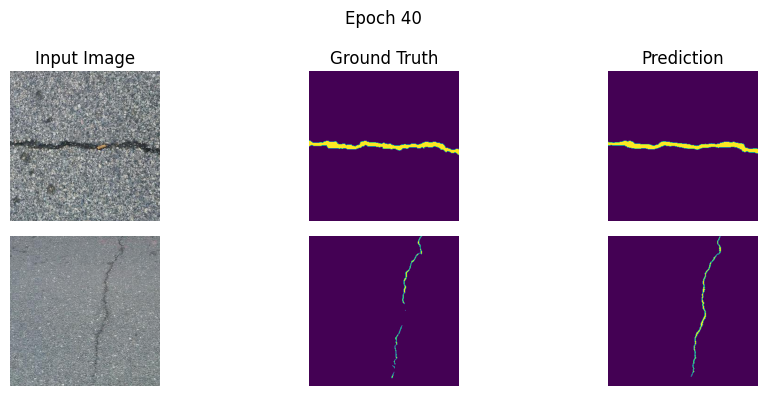

Train - Loss: 0.5823 | Dice: 0.8736 | IoU: 0.8002
        Breakdown -> total: 0.582 | ce: 0.097 | dice: 0.173 | iou: 0.245 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6049 | Dice: 0.8361 | IoU: 0.7608
        Breakdown -> total: 0.605 | ce: 0.116 | dice: 0.172 | iou: 0.247 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.605605 --> 0.604877). Saving model ...

Training completed!

Epoch 41/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.554, ce=0.095, dice=0.864, iou=0.250, focal=0.016, boundary=0.003, connectivity=0.013]


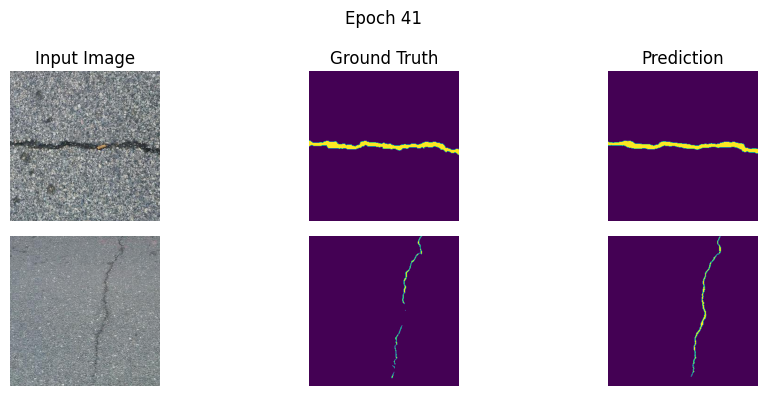

Train - Loss: 0.5827 | Dice: 0.8727 | IoU: 0.7989
        Breakdown -> total: 0.583 | ce: 0.098 | dice: 0.174 | iou: 0.245 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6042 | Dice: 0.8375 | IoU: 0.7622
        Breakdown -> total: 0.604 | ce: 0.114 | dice: 0.171 | iou: 0.246 | focal: 0.022 | boundary: 0.005 | connectivity: 0.013
Validation loss decreased (0.604877 --> 0.604230). Saving model ...

Training completed!

Epoch 42/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.530, ce=0.071, dice=0.910, iou=0.216, focal=0.013, boundary=0.005, connectivity=0.014]


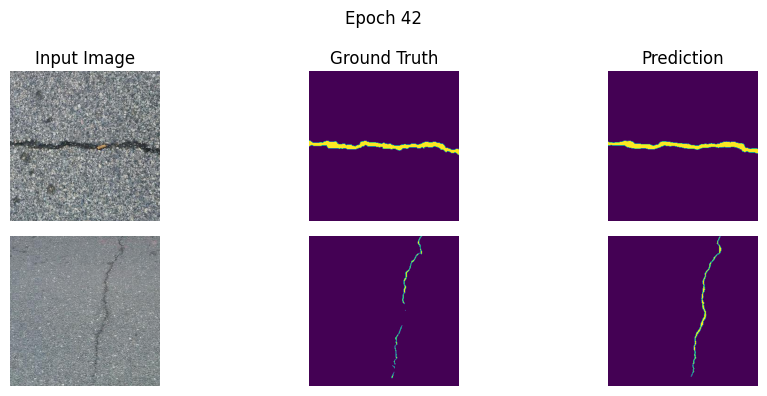

Train - Loss: 0.5818 | Dice: 0.8734 | IoU: 0.7996
        Breakdown -> total: 0.582 | ce: 0.097 | dice: 0.174 | iou: 0.245 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6086 | Dice: 0.8361 | IoU: 0.7604
        Breakdown -> total: 0.609 | ce: 0.118 | dice: 0.172 | iou: 0.247 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 1 out of 10

Training completed!

Epoch 43/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.694, ce=0.127, dice=0.844, iou=0.277, focal=0.023, boundary=0.006, connectivity=0.017]


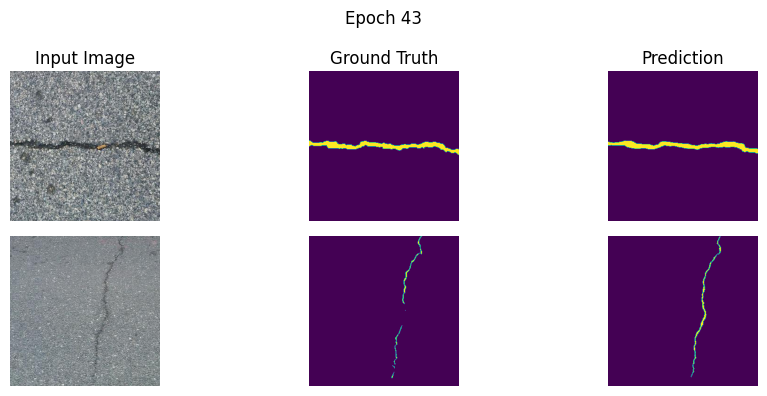

Train - Loss: 0.5832 | Dice: 0.8713 | IoU: 0.7979
        Breakdown -> total: 0.583 | ce: 0.099 | dice: 0.174 | iou: 0.245 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6134 | Dice: 0.8360 | IoU: 0.7600
        Breakdown -> total: 0.613 | ce: 0.119 | dice: 0.172 | iou: 0.247 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 2 out of 10

Training completed!

Epoch 44/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.603, ce=0.113, dice=0.886, iou=0.253, focal=0.019, boundary=0.003, connectivity=0.013]


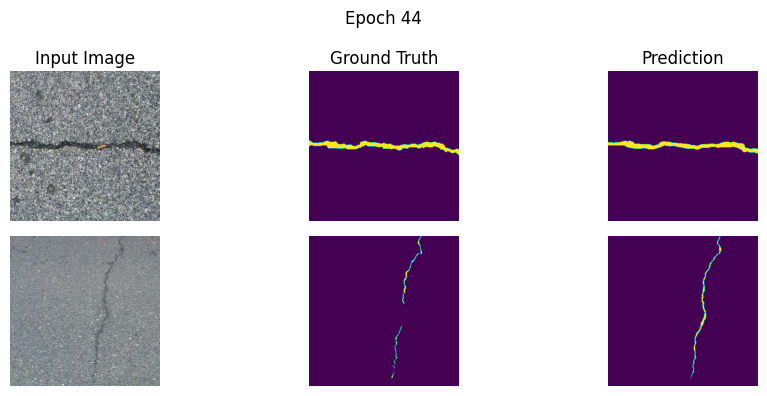

Train - Loss: 0.5788 | Dice: 0.8734 | IoU: 0.8000
        Breakdown -> total: 0.579 | ce: 0.096 | dice: 0.173 | iou: 0.244 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6058 | Dice: 0.8382 | IoU: 0.7626
        Breakdown -> total: 0.606 | ce: 0.113 | dice: 0.170 | iou: 0.245 | focal: 0.022 | boundary: 0.005 | connectivity: 0.014
EarlyStopping counter: 3 out of 10

Training completed!

Epoch 45/100


Training: 100%|██████████| 188/188 [03:04<00:00,  1.02it/s, total=0.685, ce=0.151, dice=0.845, iou=0.278, focal=0.028, boundary=0.005, connectivity=0.013]


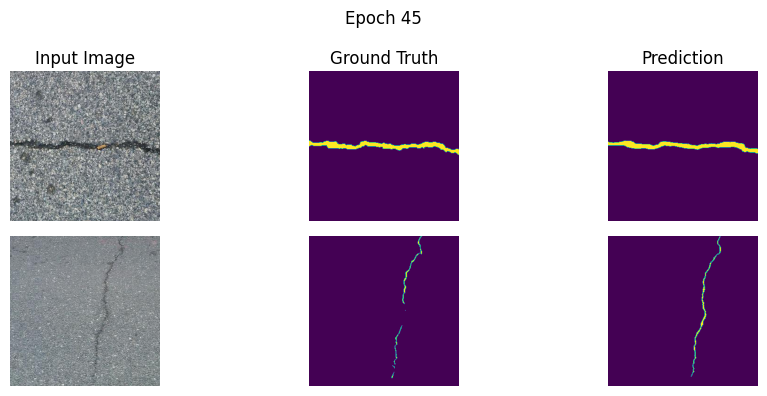

Train - Loss: 0.5826 | Dice: 0.8735 | IoU: 0.8001
        Breakdown -> total: 0.583 | ce: 0.097 | dice: 0.173 | iou: 0.245 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6087 | Dice: 0.8342 | IoU: 0.7585
        Breakdown -> total: 0.609 | ce: 0.118 | dice: 0.173 | iou: 0.248 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 4 out of 10

Training completed!

Epoch 46/100


Training: 100%|██████████| 188/188 [03:04<00:00,  1.02it/s, total=0.541, ce=0.053, dice=0.857, iou=0.253, focal=0.011, boundary=0.006, connectivity=0.013]


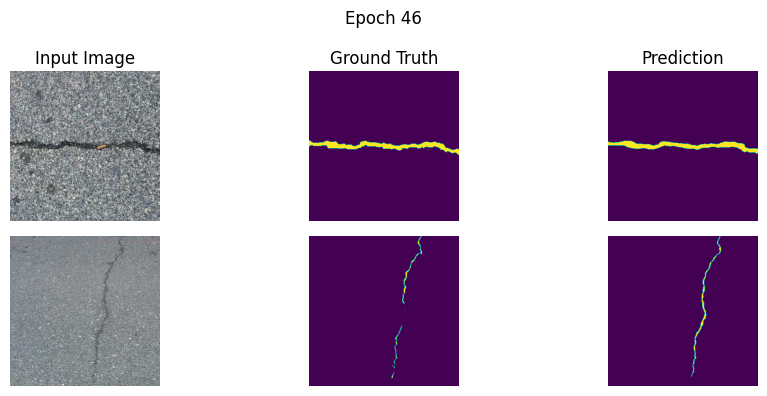

Train - Loss: 0.5795 | Dice: 0.8738 | IoU: 0.8005
        Breakdown -> total: 0.579 | ce: 0.095 | dice: 0.173 | iou: 0.245 | focal: 0.017 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6106 | Dice: 0.8364 | IoU: 0.7606
        Breakdown -> total: 0.611 | ce: 0.119 | dice: 0.171 | iou: 0.246 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 5 out of 10

Training completed!

Epoch 47/100


Training: 100%|██████████| 188/188 [03:04<00:00,  1.02it/s, total=0.526, ce=0.085, dice=0.906, iou=0.226, focal=0.016, boundary=0.003, connectivity=0.013]


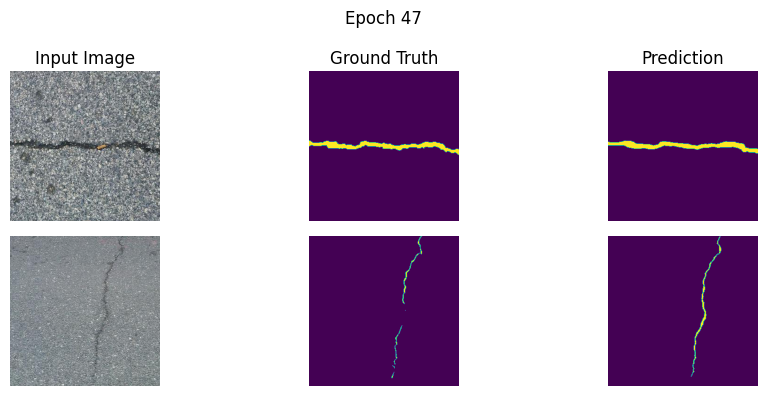

Train - Loss: 0.5787 | Dice: 0.8743 | IoU: 0.8008
        Breakdown -> total: 0.579 | ce: 0.095 | dice: 0.172 | iou: 0.244 | focal: 0.017 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6099 | Dice: 0.8383 | IoU: 0.7628
        Breakdown -> total: 0.610 | ce: 0.112 | dice: 0.171 | iou: 0.245 | focal: 0.023 | boundary: 0.006 | connectivity: 0.014
EarlyStopping counter: 6 out of 10

Training completed!

Epoch 48/100


Training: 100%|██████████| 188/188 [03:03<00:00,  1.02it/s, total=0.432, ce=0.061, dice=0.938, iou=0.154, focal=0.011, boundary=0.003, connectivity=0.016]


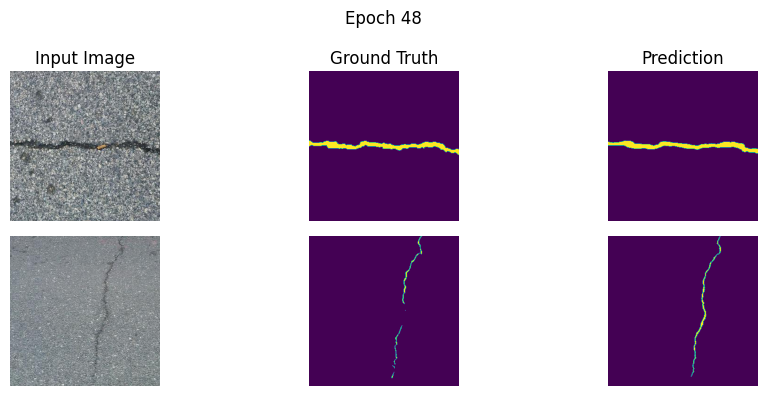

Train - Loss: 0.5778 | Dice: 0.8730 | IoU: 0.7997
        Breakdown -> total: 0.578 | ce: 0.095 | dice: 0.172 | iou: 0.243 | focal: 0.017 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6063 | Dice: 0.8370 | IoU: 0.7613
        Breakdown -> total: 0.606 | ce: 0.116 | dice: 0.171 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 7 out of 10

Training completed!

Epoch 49/100


Training: 100%|██████████| 188/188 [03:03<00:00,  1.02it/s, total=0.498, ce=0.081, dice=0.896, iou=0.220, focal=0.013, boundary=0.004, connectivity=0.013]


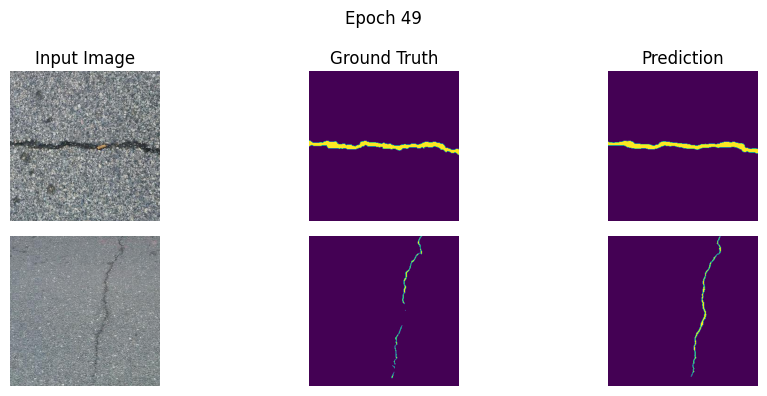

Train - Loss: 0.5783 | Dice: 0.8722 | IoU: 0.7992
        Breakdown -> total: 0.578 | ce: 0.096 | dice: 0.171 | iou: 0.242 | focal: 0.018 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6104 | Dice: 0.8371 | IoU: 0.7611
        Breakdown -> total: 0.610 | ce: 0.119 | dice: 0.171 | iou: 0.246 | focal: 0.024 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 8 out of 10

Training completed!

Epoch 50/100


Training: 100%|██████████| 188/188 [03:05<00:00,  1.01it/s, total=0.505, ce=0.054, dice=0.908, iou=0.216, focal=0.013, boundary=0.004, connectivity=0.014]


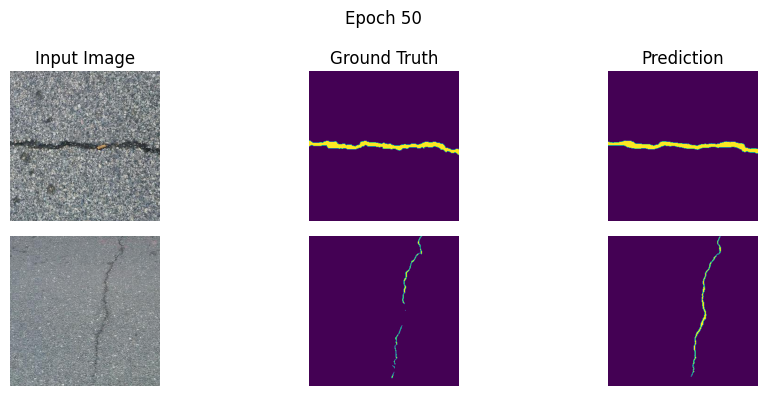

Train - Loss: 0.5784 | Dice: 0.8739 | IoU: 0.8010
        Breakdown -> total: 0.578 | ce: 0.096 | dice: 0.172 | iou: 0.243 | focal: 0.017 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6092 | Dice: 0.8367 | IoU: 0.7610
        Breakdown -> total: 0.609 | ce: 0.118 | dice: 0.171 | iou: 0.246 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 9 out of 10

Training completed!

Epoch 51/100


Training: 100%|██████████| 188/188 [03:04<00:00,  1.02it/s, total=0.533, ce=0.069, dice=0.814, iou=0.292, focal=0.012, boundary=0.004, connectivity=0.009]


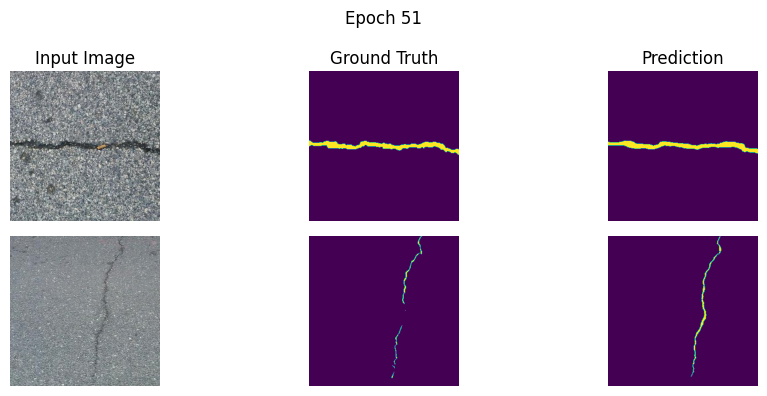

Train - Loss: 0.5777 | Dice: 0.8727 | IoU: 0.7994
        Breakdown -> total: 0.578 | ce: 0.095 | dice: 0.172 | iou: 0.244 | focal: 0.017 | boundary: 0.005 | connectivity: 0.013
Val   - Loss: 0.6080 | Dice: 0.8375 | IoU: 0.7622
        Breakdown -> total: 0.608 | ce: 0.114 | dice: 0.171 | iou: 0.245 | focal: 0.023 | boundary: 0.005 | connectivity: 0.013
EarlyStopping counter: 10 out of 10
Early stopping triggered.


In [27]:

criterion = UltimateCombinedLoss(
    ce_weight=1.0,
    focal_weight=1.0,
    
    dice_weight=1.5,
    iou_weight=0.0,       

    boundary_weight=10.0,     
    connectivity_weight=12.0, 

    class_weights=[0.2, 0.8],
    device=device
).to(device)
lr_finetune = 5e-4 # Start with a lower LR than your initial 1e-3
optimizer = optim.AdamW(model.parameters(), lr=lr_finetune)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
early_stopping = EarlyStopping(patience=10, verbose=True, path='best_finetuned_model.pt')
for epoch in range(num_epochs):
    print(f'\nEpoch {epoch+1}/{num_epochs}')
    train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_metrics = validate(model, val_loader, criterion, device, epoch + 1)

    train_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in train_metrics.items() if '_loss' in key])
    val_loss_breakdown = " | ".join([f"{key.replace('_loss', '')}: {val:.3f}" for key, val in val_metrics.items() if '_loss' in key])

    print(f'Train - Loss: {train_metrics["loss"]:.4f} | Dice: {train_metrics["dice"]:.4f} | IoU: {train_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {train_loss_breakdown}')
    
    print(f'Val   - Loss: {val_metrics["loss"]:.4f} | Dice: {val_metrics["dice"]:.4f} | IoU: {val_metrics["iou"]:.4f}')
    print(f'        Breakdown -> {val_loss_breakdown}')
    
    scheduler.step(val_metrics['loss'])

    early_stopping(val_metrics['loss'], model)
    if early_stopping.early_stop:
        print("Early stopping triggered.")
        break
    print("\nTraining completed!")



Epoch 1/100


Training: 100%|██████████| 188/188 [02:32<00:00,  1.23it/s, total=0.3496, ce=0.043, iou=0.298, focal=0.018, dice=0.883]


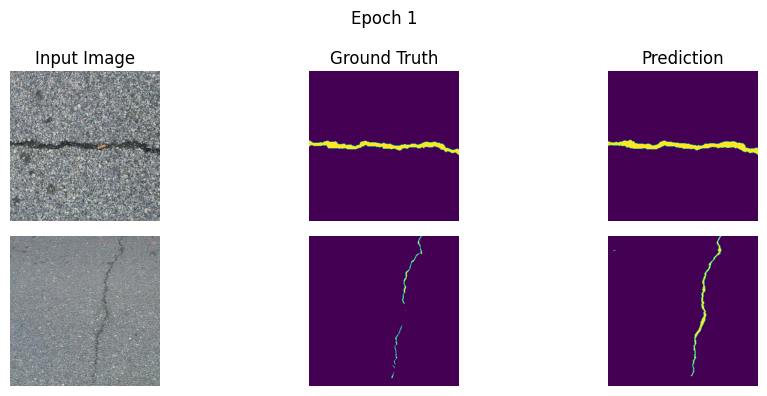

Train - Loss: 0.2990, Dice: 0.8843, IoU: 0.8126
Val   - Loss: 0.3272, Dice: 0.8510, IoU: 0.7738
Validation loss decreased (inf --> 0.327182). Saving model ...

Epoch 2/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.1560, ce=0.038, iou=0.109, focal=0.019, dice=0.948]


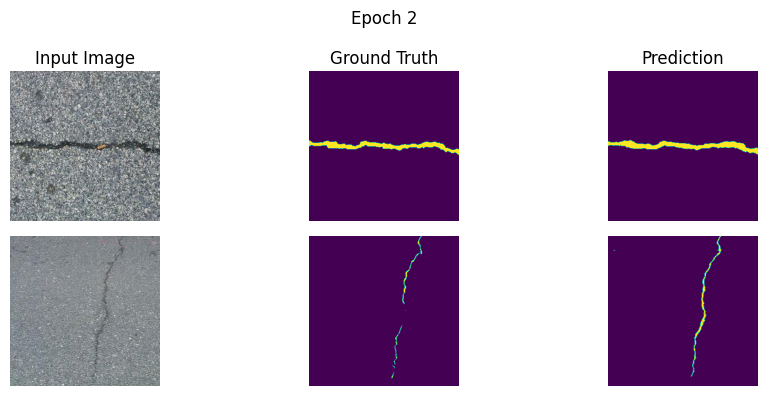

Train - Loss: 0.2987, Dice: 0.8852, IoU: 0.8141
Val   - Loss: 0.3273, Dice: 0.8515, IoU: 0.7745
EarlyStopping counter: 1 out of 10

Epoch 3/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.3279, ce=0.059, iou=0.255, focal=0.028, dice=0.863]


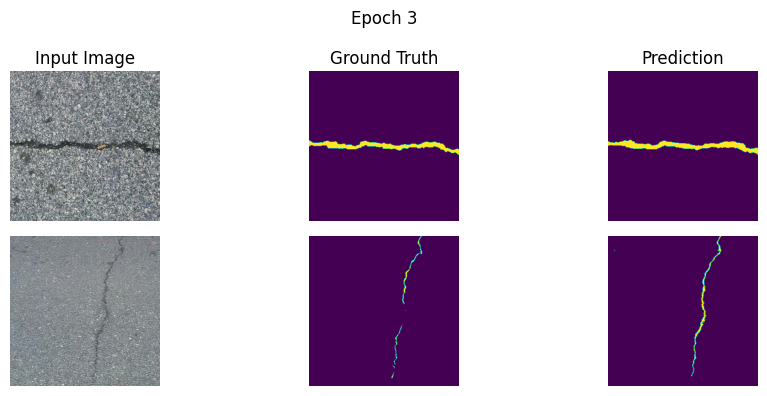

Train - Loss: 0.3001, Dice: 0.8847, IoU: 0.8136
Val   - Loss: 0.3276, Dice: 0.8511, IoU: 0.7741
EarlyStopping counter: 2 out of 10

Epoch 4/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.2808, ce=0.032, iou=0.240, focal=0.017, dice=0.908]


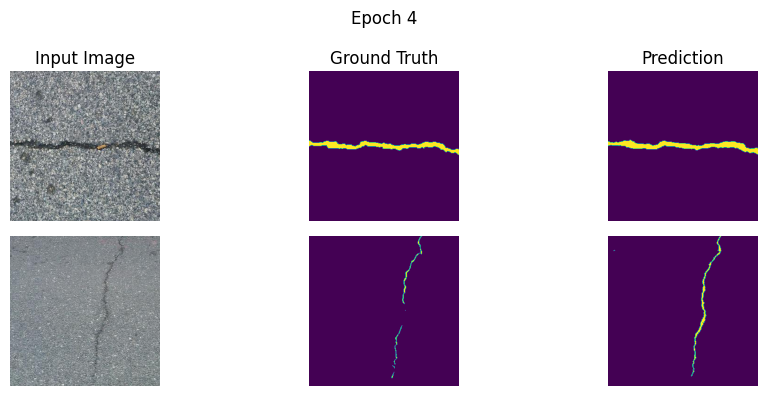

Train - Loss: 0.3000, Dice: 0.8841, IoU: 0.8126
Val   - Loss: 0.3292, Dice: 0.8513, IoU: 0.7742
EarlyStopping counter: 3 out of 10

Epoch 5/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.3199, ce=0.065, iou=0.240, focal=0.031, dice=0.870]


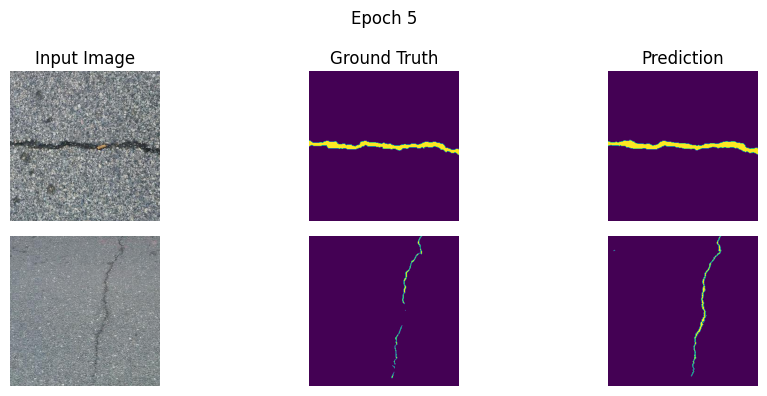

Train - Loss: 0.2997, Dice: 0.8850, IoU: 0.8135
Val   - Loss: 0.3302, Dice: 0.8511, IoU: 0.7739
EarlyStopping counter: 4 out of 10

Epoch 6/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.2487, ce=0.058, iou=0.177, focal=0.027, dice=0.865]


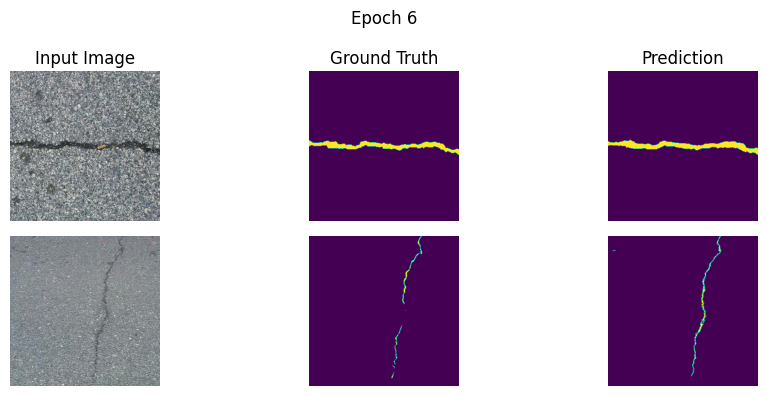

Train - Loss: 0.2988, Dice: 0.8859, IoU: 0.8152
Val   - Loss: 0.3287, Dice: 0.8511, IoU: 0.7740
EarlyStopping counter: 5 out of 10

Epoch 7/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.5414, ce=0.223, iou=0.269, focal=0.100, dice=0.818]


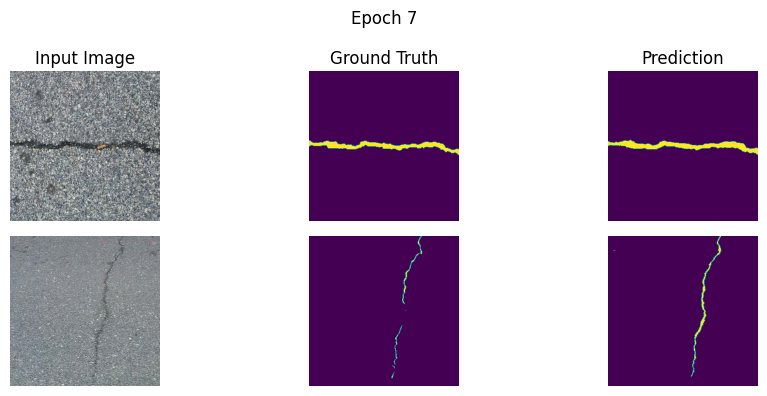

Train - Loss: 0.2998, Dice: 0.8837, IoU: 0.8123
Val   - Loss: 0.3293, Dice: 0.8511, IoU: 0.7739
EarlyStopping counter: 6 out of 10

Epoch 8/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.3728, ce=0.071, iou=0.285, focal=0.035, dice=0.839]


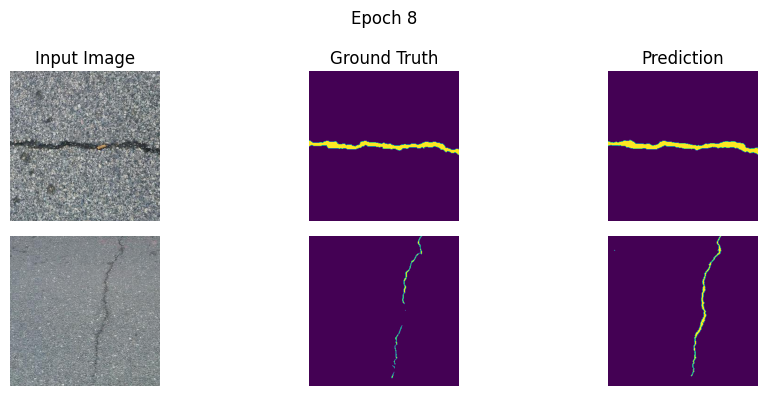

Train - Loss: 0.2990, Dice: 0.8840, IoU: 0.8124
Val   - Loss: 0.3315, Dice: 0.8508, IoU: 0.7733
EarlyStopping counter: 7 out of 10

Epoch 9/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.3419, ce=0.060, iou=0.264, focal=0.036, dice=0.878]


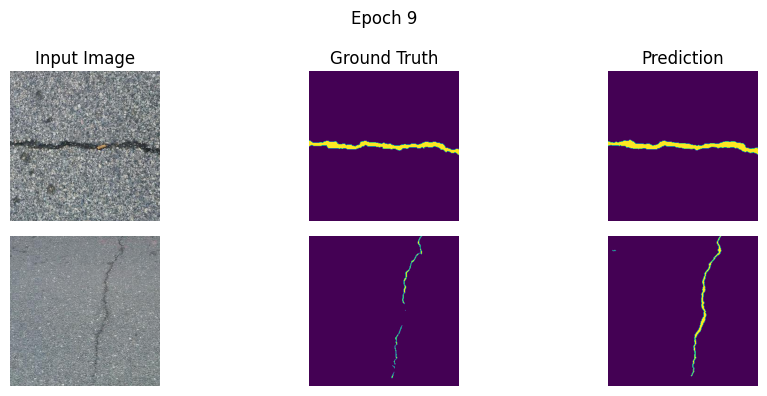

Train - Loss: 0.2989, Dice: 0.8844, IoU: 0.8127
Val   - Loss: 0.3305, Dice: 0.8509, IoU: 0.7736
EarlyStopping counter: 8 out of 10

Epoch 10/100


Training: 100%|██████████| 188/188 [02:39<00:00,  1.18it/s, total=0.3426, ce=0.065, iou=0.262, focal=0.030, dice=0.877]


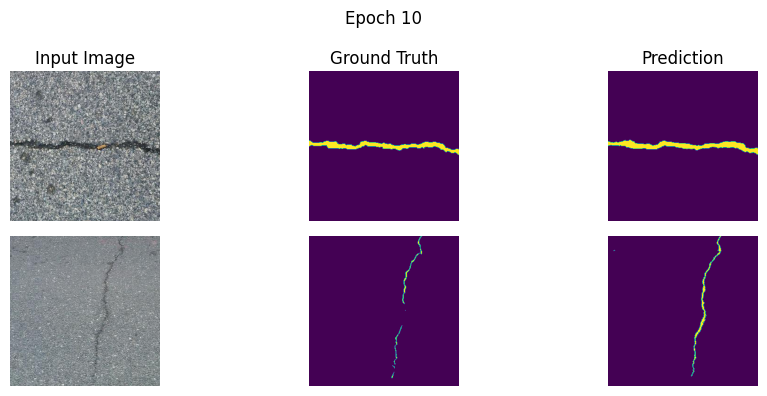

Train - Loss: 0.3019, Dice: 0.8837, IoU: 0.8118
Val   - Loss: 0.3285, Dice: 0.8512, IoU: 0.7741
EarlyStopping counter: 9 out of 10

Epoch 11/100


Training: 100%|██████████| 188/188 [02:38<00:00,  1.18it/s, total=0.4679, ce=0.166, iou=0.265, focal=0.073, dice=0.828]


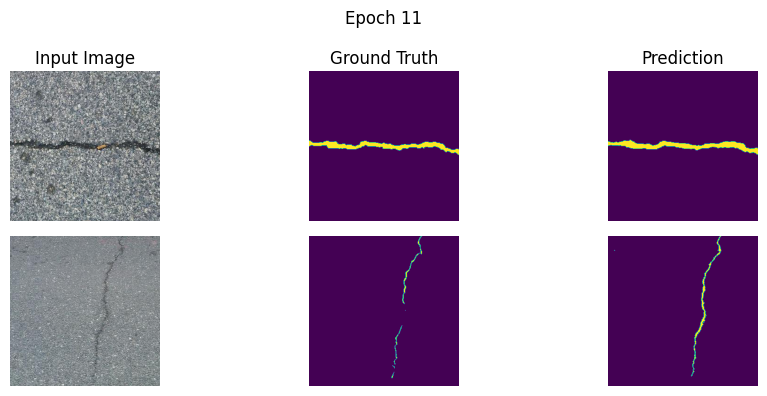

Train - Loss: 0.2995, Dice: 0.8866, IoU: 0.8155
Val   - Loss: 0.3299, Dice: 0.8511, IoU: 0.7739
EarlyStopping counter: 10 out of 10
Early stopping triggered.

Training completed!


In [29]:
batch_size = 8
num_epochs = 100
lr = 5e-8

early_stopping = EarlyStopping(patience=10, verbose=True, path='best_model_checkpoint.pt')
criterion = CombinedLoss(device=device).to(device)
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

try:
    # Training loop
    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_metrics = validate(model, val_loader, criterion, device, epoch + 1)
        
        # Print metrics
        print(f'Train - Loss: {train_metrics["loss"]:.4f}, Dice: {train_metrics["dice"]:.4f}, IoU: {train_metrics["iou"]:.4f}')
        print(f'Val   - Loss: {val_metrics["loss"]:.4f}, Dice: {val_metrics["dice"]:.4f}, IoU: {val_metrics["iou"]:.4f}')
        
        scheduler.step(val_metrics['loss'])
        early_stopping(val_metrics['loss'], model)
        if early_stopping.early_stop:
            print("Early stopping triggered.")
            break
    print("\nTraining completed!")

except KeyboardInterrupt:
    print("\nTraining interrupted by user")

In [21]:
def focal_loss(pred, target, alpha=1.0, gamma=2.0):
    ce_loss = F.cross_entropy(pred, target, reduction='none')
    pt = torch.exp(-ce_loss)
    focal_loss = alpha * (1 - pt) ** gamma * ce_loss
    return focal_loss.mean()
class CombinedLoss(nn.Module):
    def __init__(self,device='cuda'):
        super().__init__()
        class_weights = torch.tensor([0.3, 0.7])
        self.ce = nn.CrossEntropyLoss(weight = class_weights)
        self.ce_weight = 1.0
        self.iou_weight = 1.0
        self.focal_weight = 0.5

    def forward(self, pred, target):
        target = target.long()
        ce = self.ce(pred, target)
        focal_loss_val = focal_loss(pred, target)
        iou = iou_loss(pred, target)
        return self.ce_weight * ce + self.iou_weight * iou + self.focal_weight * focal_loss_val

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

batch_size = 8
num_epochs = 100
lr = 1e-4

# Create datasets
train_dataset = UDTIRICrackDataset(split='train', transform=get_transforms(train=True))
val_dataset = UDTIRICrackDataset(split='val', transform=get_transforms(train=False))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Create model
model = LM_Net(channel=3, n_classes=2)  
model = model.to(device)

# Loss and optimizer
criterion = CombinedLoss(device=device).to(device)
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

try:
    # Training loop
    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_metrics = validate(model, val_loader, criterion, device, epoch + 1)
        
        # Print metrics
        print(f'Train - Loss: {train_metrics["loss"]:.4f}, Dice: {train_metrics["dice"]:.4f}, IoU: {train_metrics["iou"]:.4f}')
        print(f'Val   - Loss: {val_metrics["loss"]:.4f}, Dice: {val_metrics["dice"]:.4f}, IoU: {val_metrics["iou"]:.4f}')
        
        scheduler.step(val_metrics['loss'])
    
    print("\nTraining completed!")

except KeyboardInterrupt:
    print("\nTraining interrupted by user")
except Exception as e:
    print(f"\nError during training: {str(e)}")


Using device: cuda

Epoch 1/100


Training:   8%|▊         | 15/188 [00:12<02:29,  1.16it/s, loss=1.0929, dice=0.4844, iou=0.4656]


Training interrupted by user


In [23]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

batch_size = 8
num_epochs = 100
lr = 1e-4

# Create datasets
train_dataset = UDTIRICrackDataset(split='train', transform=get_transforms(train=True))
val_dataset = UDTIRICrackDataset(split='val', transform=get_transforms(train=False))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Create model
model = LM_Net(channel=3, n_classes=2)  
model = model.to(device)

# Loss and optimizer
criterion = CombinedLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

try:
    # Training loop
    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_metrics = validate(model, val_loader, criterion, device, epoch + 1)
        
        # Print metrics
        print(f'Train - Loss: {train_metrics["loss"]:.4f}, Dice: {train_metrics["dice"]:.4f}, IoU: {train_metrics["iou"]:.4f}')
        print(f'Val   - Loss: {val_metrics["loss"]:.4f}, Dice: {val_metrics["dice"]:.4f}, IoU: {val_metrics["iou"]:.4f}')
        
        scheduler.step(val_metrics['loss'])
    
    print("\nTraining completed!")

except KeyboardInterrupt:
    print("\nTraining interrupted by user")
except Exception as e:
    print(f"\nError during training: {str(e)}")


Using device: cuda

Epoch 1/100


Training:   1%|          | 2/188 [00:02<04:14,  1.37s/it, loss=1.3510, dice=0.4437, iou=0.3612]


Training interrupted by user


In [24]:
# torch.save(model, 'entire_model.pth')
# torch.save(model.state_dict(), 'model_weights.pth')

In [25]:
# import torch
# from torch.utils.data import Dataset, DataLoader
# import os
# import numpy as np
# from PIL import Image
# import cv2
# from tqdm import tqdm
# import albumentations as A
# from albumentations.pytorch import ToTensorV2

# # import your LM_Net here!

# class CrackTestDataset(Dataset):
#     def __init__(self, test_dir, transform=None):
#         self.test_dir = test_dir
#         self.transform = transform
#         self.images = sorted([f for f in os.listdir(test_dir) 
#                              if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
#         print(f"Found {len(self.images)} test images")
#     def __len__(self):
#         return len(self.images)
#     def __getitem__(self, idx):
#         img_name = self.images[idx]
#         img_path = os.path.join(self.test_dir, img_name)
#         image = Image.open(img_path).convert('RGB')
#         image = np.array(image)
#         orig_height, orig_width = image.shape[:2]
#         if self.transform:
#             transformed = self.transform(image=image)
#             image = transformed["image"]
#         return image, img_name, (orig_height, orig_width)

# def get_test_transforms():
#     return A.Compose([
#         A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
#         ToTensorV2(),
#     ])

# def load_model(model_path, device, num_classes=2):
#     model = LM_Net(channel=3, n_classes=num_classes)
#     if os.path.exists(model_path):
#         checkpoint = torch.load(model_path, map_location=device)
#         if 'model_state_dict' in checkpoint:
#             model.load_state_dict(checkpoint['model_state_dict'])
#         else:
#             model.load_state_dict(checkpoint)
#         print(f"Loaded model from {model_path}")
#     else:
#         print(f"Warning: Model file {model_path} not found. Using untrained model.")
#     model = model.to(device)
#     model.eval()
#     return model

# def predict_and_save_masks_voc(model, dataloader, device, output_dir):
#     os.makedirs(output_dir, exist_ok=True)
#     with torch.no_grad():
#         for images, img_names, orig_sizes in tqdm(dataloader, desc="Saving VOC masks"):
#             images = images.to(device)
#             outputs = model(images)
#             # Get predictions
#             if outputs.shape[1] > 1:
#                 predictions = torch.argmax(outputs, dim=1)
#             else:
#                 predictions = torch.sigmoid(outputs).squeeze(1)
#                 predictions = (predictions > 0.5).float()
#             for i, img_name in enumerate(img_names):
#                 pred_mask = predictions[i].cpu().numpy()  # (H, W)
#                 orig_height, orig_width = orig_sizes[i]
#                 # If your model resizes images internally, resize mask back to orig
#                 if pred_mask.shape != (orig_height, orig_width):
#                     pred_mask = cv2.resize(pred_mask, (orig_width, orig_height), interpolation=cv2.INTER_NEAREST)
#                 # Save as single-channel PNG with 0/255 values
#                 binary_mask = (pred_mask * 255).astype(np.uint8)
#                 mask_name = os.path.splitext(img_name)[0] + '.png'
#                 mask_path = os.path.join(output_dir, mask_name)
#                 cv2.imwrite(mask_path, binary_mask)
#                 if i == 0:
#                     print(f"Saved first VOC mask: {mask_path} shape={binary_mask.shape}")

# def main():
#     test_dir = '/kaggle/input/udtiri-crack/UDTIRI-Crack/UDTIRI-Crack Generalization2/image'
#     model_path = '/kaggle/working/model_weights.pth'
#     output_dir = '/kaggle/working/SegmentationClass_Generalization2'
#     batch_size = 2
#     num_classes = 2

#     device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#     print(f"Using device: {device}")
#     test_dataset = CrackTestDataset(
#         test_dir=test_dir,
#         transform=get_test_transforms()
#     )
#     test_loader = DataLoader(
#         test_dataset, 
#         batch_size=batch_size, 
#         shuffle=False, 
#         num_workers=4
#     )
#     model = load_model(model_path, device, num_classes)
#     predict_and_save_masks_voc(
#         model,
#         test_loader, 
#         device, 
#         output_dir
#     )
#     print(f"\nSegmentation complete!")
#     print(f"Results saved in: {output_dir}")
#     print(f"Total images processed: {len(test_dataset)}")

# if __name__ == "__main__":
#     main()


In [26]:
# import shutil

# # Arguments:
# #   base_name: The output file path (without extension)
# #   format: 'zip'
# #   root_dir: Directory you want to zip
# shutil.make_archive('/kaggle/working/segmentation_results_generalization2', 'zip', '/kaggle/working/SegmentationClass_Generalization2')


In [27]:
# import pycocotools.mask as mask_util
# import json